In [1]:
%matplotlib inline
import numpy as np
import sympy as sp
from sympy.abc import x as x_sym
import matplotlib.pyplot as plt

from scipy import interpolate
from sklearn.linear_model import LinearRegression

from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display, Math

import ipywidgets as widgets

<em>MathJax imports</em>
$\require{color}$

# Taylor Series
### Function approximations. Higher order derivatives. Polynomial approximations of real functions. Euler's formula. The Taylor Inequality

---

To quote Wikipedia: <i>"In mathematics, the Taylor Series or Taylor expansion of a function is an infinite sum of terms that are expressed in terms of the function's derivatives at a single point."</i> In this notebook we are going to explore this concept and try to explain it.

Let's first look at the purpose behind Taylor Series and try to work our way up from there. <br>Probably the most important application of Taylor series is to use their partial sums to approximate functions. So basically we are trying to "approximate a function". But what does that even mean?


## 1. What is function approximation?

Function approximation problem is one, where we need to select a function (maybe among a well-defined class) that closely matches ("approximates") a target function in a task-specific way. The need for this arises in many different fields, including engineering, physics, economics, and computer science. It is often used to model or simulate complex systems of phenomena, where theoretical exact mathematical representations of the system or process are not feasible to obtain (calculate).

Generally, function approximation is used in two distinct cases (one can distinguish two major classes of problems):

1. The target function is <b>known</b>: Here we investigate how a certain known function (possibly hard (or impossible) to compute, differentiate or integrate, for example special functions like $sin(x)$ and $cos(x)$) can be approximated by a specific class of function (for example, polynomials), which often have desirable properties (inexpensive computation, continuity, integral and limit values, etc.). 


2. The target function is <b>unknown</b>: Here for an unknown function $g:X\rightarrow Y$, only a set of points $(x, g(x))$ is given to us. Now, depending on the domain $X$ (the set of inputs, accepted by the function) and the codomain $Y$ (the set of outputs, produced by the function), different techniques can be applied to approximate $g$. For example when $g$ is an operation on the real numbers, techniques of interpolation, extrapolation, regression analysis, and curve fitting can be used. Let's find out what some of those "look like":
    ### A. Interpolation
    Let's suppose that we have a set of points:
    <table style="margin-left: 0">
        <thead>
            <tr>
                <th>$x$</th>
                <th>f(x)</th>
            </tr>
        </thead>
        <tbody>
            <tr>
                <td>0</td>
                <td>0.0</td>
            </tr>
            <tr>
                <td>1</td>
                <td>0.8415</td>
            </tr>
            <tr>
                <td>2</td>
                <td>0.9093</td>
            </tr>
            <tr>
                <td>3</td>
                <td>0.1411</td>
            </tr>
            <tr>
                <td>4</td>
                <td>-0.7568</td>
            </tr>
            <tr>
                <td>5</td>
                <td>-0.9589</td>
            </tr>
            <tr>
                <td>6</td>
                <td>-0.2794</td>
            </tr>
        </tbody>
    </table>
    Using interpolation, we can find new data points based on the range of a discrete set of known data points. Having the given points in the table above, interpolating based on them means to estimate the function output on intermediate points like $x=2.5$. Let's look at some interpolation methods. First we'll need some helper methods, which will help us configure our plots, plot functions, points and approximations.     

In [2]:
def plot_config(title=None, legend_loc="lower left", show_legend=True, ax=None, bbox_to_anchor=None, xlabel="x", ylabel="y"): 
    """
    Helper method which renders a grid on the current matplotlib figure
    """
    if ax is None:
        plt.gca().set_aspect("equal")
        plt.xlabel(xlabel)
        plt.ylabel(ylabel)
        plt.title(title)
    else:
        ax.axis('equal')
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        ax.set_title(title)
    
    ax = plt if ax is None else ax
    ax.grid(True, which='both', zorder=1)
    ax.axhline(y=0, color='k', linewidth=0.5, zorder=2)
    ax.axvline(x=0, color='k', linewidth=0.5, zorder=2)
    if show_legend: ax.legend(loc=legend_loc, bbox_to_anchor=bbox_to_anchor)
    
def plot_limits_based_on_points(points):
    # Calculate the range of x and y coordinates
    x_range = max(points[:, 0]) - min(points[:, 0])
    y_range = max(points[:, 1]) - min(points[:, 1])

    # Determine the maximum range between x and y coordinates
    max_range = max(x_range, y_range)

    # Calculate the center of the data points
    x_center = (max(points[:, 0]) + min(points[:, 0])) / 2
    y_center = (max(points[:, 1]) + min(points[:, 1])) / 2

    # Calculate the margin as a fraction of the maximum range
    margin = max_range * 0.1

    # Set the x-axis and y-axis limits with margins to create a square-shaped plot
    plt.xlim(x_center - max_range / 2 - margin, x_center + max_range / 2 + margin)
    plt.ylim(y_center - max_range / 2 - margin, y_center + max_range / 2 + margin)

In [3]:
def plot_approximation(points, plot_title, approximation_function):
    """
    Helper method which plots a scatter plot of data points and an approximation curve.
    
    Parameters:
        points (numpy.ndarray): Array of data points with x and y coordinates.
        plot_title (str): Title of the plot.
        approximation_function (function): Function to compute y-coordinates for the approximation curve.
    """
    plt.scatter(points[:, 0], points[:, 1], c="r", label="Data Points", zorder=4)
    
    # Generate a set of x-coordinates for plotting the approximation curve
    x_plot = np.linspace(points[0, 0]-10, points[-1, 0]+10, num=1000, endpoint=True)
    
    # Check if an approximation function is provided
    if(approximation_function is not None):
        # Compute the interpolated y-values using the approximation function
        y_interpolated = approximation_function(points, x_plot)
        # Plot the approximation curve using the computed y-values
        plt.plot(x_plot, y_interpolated, label="Approximation", zorder=5)
    
    
    plot_config(title=plot_title)
    plot_limits_based_on_points(points)
    
    plt.show()

These are the data points, which we are working with as given by the table above:

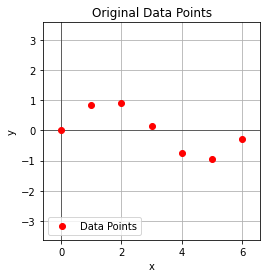

In [4]:
data_points = np.array([(0, 0), (1, 0.8415), (2, 0.9093), (3, 0.1411), (4, -0.7568), (5, -0.9589), (6, -0.2794)])
plot_approximation(data_points, "Original Data Points", None)

* #### Piece-wise constant (nearest-neighbor) interpolation
The simplest method of interpolation is for each point to assign the value of the closest real data point. This is very computationally cheap and a favorable choice in higher-dimension multivariate interpolation.

In [5]:
def piecewise_constant_interpolation(data_points, x_inputs):
    # Find the indices of the closest points
    closest_inds = np.abs(data_points[:, 0][:, None] - x_inputs).argmin(axis=0)
    # Interpolate
    y_new = data_points[closest_inds, 1]

    return y_new

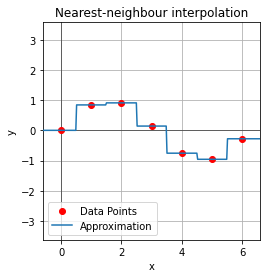

In [6]:
plot_approximation(data_points, "Nearest-neighbour interpolation", piecewise_constant_interpolation)

* #### Linear interpolation
Another very simple method of interpolation is the linear interpolation. When we want to find $f(2.5)$ it may be reasonable to think that it is the average of $f(2)$ and $f(3)$, because 2.5 is halfway between 2 and 3. Generally the interpolant between $(x_a, y_a)$ and $(x_b, y_b)$ when doing linear interpolation is given by: $$y=y_a + (y_b - y_a)\frac{(x - x_a)}{(x_b - x_a)}$$  at the point $(x, y)$. (Which actually is just the equation of a line between the two points $a$ and $b$.

In [7]:
def linear_interpolation(data_points, x_inputs):
    # Extract x and y coordinates from the input array
    x = data_points[:, 0]
    y = data_points[:, 1]

    # Compute the interpolation weights for each point in x_new
    inds = np.searchsorted(x, x_inputs)
    inds = np.clip(inds, 1, len(x)-1)
    x_a = x[inds-1]
    x_b = x[inds]
    y_a = y[inds-1]
    y_b = y[inds]
    
    alpha = (x_inputs - x_a) / (x_b - x_a)

    # Interpolate between the nearest y-coordinates using the weights
    y_new = (1 - alpha) * y_a + alpha * y_b
    return y_new

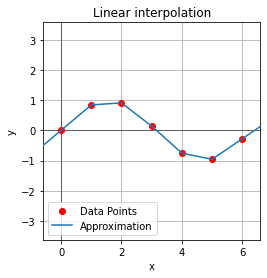

In [8]:
plot_approximation(data_points, "Linear interpolation", linear_interpolation)

* #### Polynomial interpolation
Polynomial interpolation is a generalization of linear interpolation, where we replace the linear interpolant between each two points, with one polynomial of higher degree for the whole dataset. We construct a polynomial of degree at most n-1 going through all of the data points (which is proven to be possible by the [Interpolation theorem](https://en.wikipedia.org/wiki/Polynomial_interpolation#Interpolation_theorem)). The interpolant is a polynomial, which is infinitely differentiable, which makes this approach better than the previous two. 

In [9]:
def polynomial_interpolation(data_points, x_inputs):
    # Extract the x and y values from data points
    x = data_points[:, 0]
    y = data_points[:, 1]
        
    coefficients = np.polyfit(x, y, deg = len(data_points) - 1) # Perform polynomial fitting
    poly = np.poly1d(coefficients) # Create a polynomial function using the coefficients
    
    return poly(x_inputs) # Evaluate the polynomial function for the given x inputs

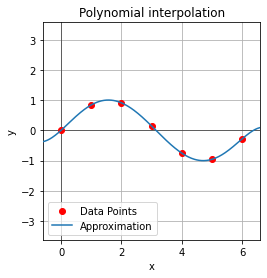

In [10]:
plot_approximation(data_points, "Polynomial interpolation", polynomial_interpolation)

* #### Spline interpolation
With this approach, the intepolant is a special type of piecewise polynomial, called a spline. Instead of fitting one high-degree polynomial to all of the values at once, we fit a low-degree polynomial to a smaller subset of the values. We choose polynomial pieces, such that they fit smoothly together. The classical approach is to use polynomials of the third degree (because each successive polynomial must have equal values, derivatives and second derivatives at their joining knots, which can only be achieved if polynomials of degree 3 (cubic polynomials) or higher are used).

In [11]:
def spline_interpolation(data_points, x_inputs):
    # Extract x and y coordinates from the input array
    x = data_points[:, 0]
    y = data_points[:, 1]

    # Compute the cubic spline coefficients for the input data points
    spline = interpolate.splrep(x, y)
    # Evaluate and return the spline at the input x-coordinates
    return interpolate.splev(x_inputs, spline)

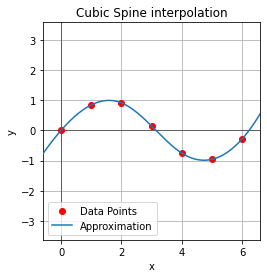

In [12]:
plot_approximation(data_points, "Cubic Spine interpolation", spline_interpolation)

### B. Extrapolation
Extrapolation is a type of estimation beyond the original observation range. It is very similar to interpolation, which as we already saw produces estimates between known observations, but extrapolation is subject to a lot more uncertainty and a very high risk of producing meaningless results.

### C. Regression analysis
Regression analysis is a statistical technique used to estimate the relationship between a dependent variable and one or more independent variables. The most common form is linear regression, which finds the line that "best" fits the data based on a specific mathematical criterion, such as the method of ordinary least squares. This allows researchers to estimate the dependent variable's expected value when the independent variables are given. Alternative forms of regression use different procedures to estimate location parameters or the conditional expectation across non-linear models. Regression and interpolation/extrapolation are both mathematical techniques that involve fitting a line to a set of data points, but they have different purposes and methods. Linear interpolation is used to estimate values between known data points, while linear regression is used to model the relationship between two variables by finding the line of best fit through a set of data points. Here we won't go into detail about how the actual Linear Regression Model training algorithm works, but let's just make it fit to our data and see how it works. (for this example, we'll use a different set of points, which are in a Gaussian distribution around the line $y=0.5x+5$).

In [13]:
def simple_linear_regression(data_points, x_inputs):
    # Extract the x and y values from the data points
    x = data_points[:, 0]
    y = data_points[:, 1]
    
    # Reshape the x values to be a 2D array with shape (n, 1),
    # where n is the number of data points. This is necessary
    # because the LinearRegression model expects a 2D array as
    # its input for the x values.
    x = x.reshape((-1, 1))
    
    # Create a LinearRegression model and fit it to the data
    model = LinearRegression()
    model.fit(x, y)
    
    # Reshape the x_inputs array to be a 2D array with shape (m, 1),
    # where m is the number of input values to make predictions for.
    # This is necessary because the predict method of the LinearRegression
    # model expects a 2D array as its input for the x values.
    x_inputs = x_inputs.reshape((-1, 1))
    
    # Use the model to make predictions for the given input values
    return model.predict(x_inputs)

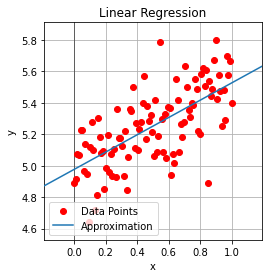

In [14]:
x_regression = np.linspace(0, 1, 100)

# Generate corresponding y values with a linear relationship and some added noise
y_regression = 0.5 * x_regression + 5 + np.random.normal(0, 0.2, 100)

# Combine x and y into a 2D numpy array
data_points_regression = np.column_stack((x_regression, y_regression))

plot_approximation(data_points_regression, "Linear Regression", simple_linear_regression)

Those and other techniques are useful, when we don't know the underlying function and have only a set of points, available to us. But the interesting scenario in our case is the first (1.) one - where the function is known, but have certain "flaws" like being computationally expensive. Let's now look at how is that even a problem and some examples of it.

## 2. Why can't we compute all functions numerically?

But why would we need such approximations? Why can't we compute all functions numerically? Well, even in mathematics a common problem is that we don't actually know how to calculate certain functions like these. For example it isn't easy to calculate $sin(1)$ - we can look it up in a table, or draw a triangle and make measurements, but those solutions aren't ideal. To solve this problem, mathematicians have developed very good approximations to these functions. Here let's look at several problems, which make function approximations like the Taylor series necessary:<br>

1. <b>Infinite precision</b>: Many mathematical functions, such as trigonometric ($sin, cos, `dots$), exponential and logarithmic functions, either have infinite fractional expansions or cannot be represented accurately by basic operations (addition, subtraction, multiplication and division). Computers cannot directly represent and calculate these functions with infinite precision because of their finite precision due to the use of floating-point arithmetic (the mathematical operations that are performed on real numbers on a computer system with a finite number of bits).
2. <b>Computational complexity</b>: Some functions have high computational complexity, meaning that computing them accurately would require an impractical amount of time or computational resources. For example, functions like the factorial function or the Riemann zeta function have computations that grow rapidly with the input size, making them computationally expensive for large inputs.
3. <b>Efficiency</b>: Function approximations, such as the Taylor series expansion, provide a way to represent complex functions with simpler expressions that are computationally efficient. By truncating the Taylor series at a finite number of terms, we can obtain a polynomial approximation that can closely approximate the original function within a certain range or interval. This allows for faster computations and better utilization of computational resources. In general computers understand polynomials, because they are composed of elementary operations, as opposed to special functions, which have infinite decimal expansions.
4. <b>Numerical stability</b>: Certain functions may suffer from numerical instability, where small errors in the input or computation can lead to significant errors in the output. Function approximations can provide more stable and accurate results in such cases. Some examples include:
    * functions involving division by small numbers (the division amplifies the relative errors in the divisor, leading to significant errors in the result) - $f(x) = \frac{1}{x - 1}$ near $x = 1$
    * functions with subtractive cancellation (limited precision of floating-point arithmetic) - $f(x) = e^x - 1$ for very small values of $x$
    * functions with ill-conditioned problems - small changes in the input can lead to large changes in the output (highly nonlinear equations, functions with steep gradients, ...) - $f(x) = x^3 - 1000x^2 + 2000x - 999$ near $x = 1$
    * functions with singularities or discontinuities (such as step functions or functions with asymptotes) - instability arises due to sudden changes or undefined behavior. -  $f(x) = \frac{1}{sin(x)}$ near $x = 0$
    
By carefully selecting the number of terms in the approximation, we can control the trade-off between accuracy and stability.

## 3. Why are polynomial functions very userful approximators?

In 1. we already saw some easy (and a bit more complex like the regression) methods for approximating a function based on a given set of points (around the given point/set of points). In general from the two distinct approximation tasks, we are interested in the first one, where the function is known to us but we want to approximate it with a different class of functions. Most of the times it is very useful to find polynomial approximations. But is that always possible, if not - when and also why are they the preferred class of functions when it comes to approximations?

The Weierstrass approximation theorem states exactly that: every continuous function defined on a closed interval $[a, b]$ can be uniformly approximated as closely as desired by a polynomial function.

> <b>Weierstrass Approximation Theorem</b> — Suppose $f$ is a continuous real-valued function defined on the real interval $[a, b]$. For every $\epsilon > 0$, there exists a polynomial $p$ such that for all $x \in [a, b]$, we have $|f(x) - p(x)|  < \epsilon$, or equivalently, the supremum norm $||f - p|| < \epsilon$.

Keeping that in mind, let's look at why polynomials are particularly useful approximators:
1. Polynomial functions are <b>continuous over their entire domain</b>. This means that there are no jumps or discontinuities in their behavior, which makes them suitable for approximating functions that are also continuous.
2. Polynomial functions are <b>differentiable to any desired degree</b>. This property is advantageous when approximating functions that require differentiation, as it allows for the approximation of derivatives as well. The ability to compute derivatives accurately is crucial in many mathematical and scientific applications, such as optimization,  modeling physical phenomena, or solving differential equations. 
3. Computation efficiency: Polynomial functions are <b>computationally efficient</b> to evaluate and manipulate as we already discussed. Polynomial approximations are practical for real-time computations and numerical simulations, because arithmetic operations on them, such as addition, multiplication, and differentiation, can be performed efficiently using straightforward algorithms. 
Those three characteristics and the fact that it is even possible to approximate most functions with polynomials, make them very versatile and useful. However, it is important to note that the accuracy of any polynomial approximation strongly depends on several factors - the degree of the polynomial, the range of approximation, and the specific behavior of the underlying function. 

## 4. Higher order derivatives

Suppose we have the function $f(x)$ and we want to approximate it "around" a certain point (for example let's say $x_0=0$). It proves to be very useful to look at the derivatives of the function at that point. 

First, let's look at what information the first derivative gives to us. It provides us with information about the instantaneous rate of change when we calculate it in a specific point. Basically it tells us what happens with that function around this exact point. More specifically:
* when the derivative is positive ($f'(x_0) > 0$), the function is increasing around that point.
* when the derivative is negative ($f'(x_0) < 0$) the function is decreasing around that point.

And also its magnitude represents the steepness or slope of the tangent line to the function at a certain point.
Suppose we have the function: $$f(x) = \frac{x^3+3x^2-6x-8}{4}$$

Let's define a helper method, because we are going to be plotting a lot of functions from now on.

In [15]:
def plot_function(function, x_lim = (-6, 6), y_lim = (-6, 6), label = None, ax=None, color=None, linestyle="-", linewidth=None):
    """
    Plots a function curve.

    Parameters:
        function (callable): The function to plot.
        x_lim (tuple): The limits for the x-axis (default: (-10, 10)).
        y_lim (tuple): The limits for the y-axis (default: (-10, 10)).
        label (str): The label for the plot (default: None).

    Returns:
        None
    """
    function = np.vectorize(function)
    x_values = np.linspace(x_lim[0], x_lim[1], num=1000)
    y_values = function(x_values)

    if ax is not None:
        ax.set_xlim(x_lim[0], x_lim[1])
        ax.set_ylim(y_lim[0], y_lim[1])
    else:
        plt.xlim(x_lim[0], x_lim[1])
        plt.ylim(y_lim[0], y_lim[1])
    
    ax = plt if ax is None else ax
    return ax.plot(x_values, y_values, label=label, color=color, linestyle=linestyle, linewidth=linewidth)

And now we can plot our function around 0. (In the code we will call $f$ - `func` )

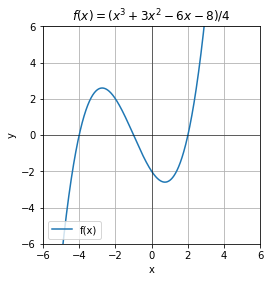

In [16]:
# Step 1: Define the function
func = lambda x: (x ** 3 + 3 * x ** 2 - 6 * x - 8) / 4
plot_function(func, label="f(x)")
plot_config(title="$f(x) = (x^3+3x^2-6x-8) / 4$")
plt.show()

Suppose we want to know what happens to this function around $x = 0$.

If we just look at $f(0)$ we will know that the graph of the function intersects the y-axis at the point $(0, f(0)$:

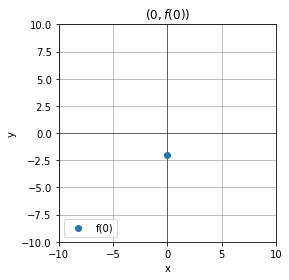

In [17]:
plt.scatter([0], func(0), zorder=6, label="f(0)")
plot_config(title="$(0, f(0))$")
plt.xlim(-10, 10)
plt.ylim(-10, 10)
plt.show()

But as we know that infinitely many functions exist that intersect the y-axis at that point, so that does not really help us a lot.

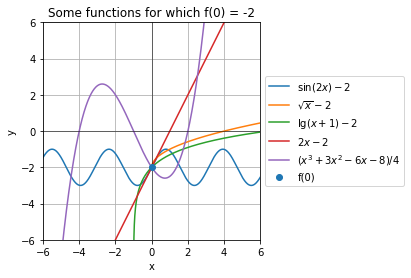

In [18]:
plot_function(lambda x: np.sin(2*x) - 2, label="$\sin(2x)-2$")
plot_function(lambda x: np.sqrt(x) - 2, label="$\sqrt{x}-2$", x_lim=(0, 6))
plot_function(lambda x: np.log(x+1) - 2, label="$\lg(x+1)-2$", x_lim=(-0.99999, 6))
plot_function(lambda x: 2 * x - 2, label="$2x-2$")
plot_function(func, label="$(x^3+3x^2-6x-8) / 4$")
plt.scatter([0], func(0), zorder=6, label="f(0)")
plot_config(title="Some functions for which f(0) = -2", bbox_to_anchor=(1, 0.5), legend_loc="center left")
plt.show()

We can take a look at the first derivative of our function at that point. This can help us in understanding it better. 

Derivative at x = 0: -1.5
Derivative function: 


3*x**2/4 + 3*x/2 - 3/2

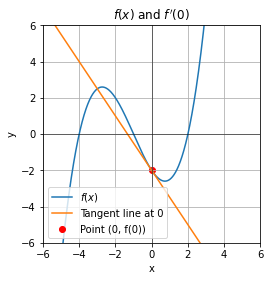

In [19]:
# Step 1: Choose the point
x_point = 0
y_point = func(x_point)

# Step 2: Calculate the derivative using sympy
def get_function_derivative(function, order=1):
    return sp.lambdify(x_sym, get_function_derivative_sym(function, order)) # convert the sympy function to a python function

def get_function_derivative_sym(function, order):
    return sp.diff(function(x_sym), x_sym, order) # differentiate the function with respect to x

func_derivative = get_function_derivative(func)

# Step 3: Define the equation of the tangent line
def tangent_line_at_point(function, function_derivative, x_point):
    slope = function_derivative(x_point)
    y_point = function(x_point)
    return lambda x: slope * (x - x_point) + y_point

plot_function(func, label="$f(x)$")
plot_function(tangent_line_at_point(func, func_derivative, 0), label="Tangent line at 0")
plt.scatter(x_point, y_point, color='red', label='Point (0, f(0))')

# Configure the plot and print the derivative function and value at x = 0
plot_config(title="$f(x)$ and $f'(0)$")
print("Derivative at x = 0:", func_derivative(0))
print("Derivative function: ")
sp.diff(func(x_sym), x_sym)

The first derivative provides us with the slope of the tangent line to the graph of the function at $x=0$. Knowing that the slope is negative, we now know that our function is decreasing around that point. Also the actual value of the derivative shows the steepness of the slope. A high value means a steep slope. Another important property of the derivative in general is that when it is 0 it means that there is a local extremum of the function (local minimum or maximum).

In [20]:
def animate_tangent_line_of_function(function, point_x_lim=(-6, 6), x_lim=(-6, 6)):
    """
    Animate the tangent line of a given function at various points.

    Args:
        function (callable): The function for which the tangent line is animated.
        point_x_lim (tuple): The x-axis limits for the points where the tangent lines are animated.
        x_lim (tuple): The x-axis limits for the overall plot.

    Returns:
        HTML: An HTML object containing the animation.

    """
    f_derivative = get_function_derivative(function)
    fig, ax = plt.subplots()

    x_vals = np.linspace(x_lim[0], x_lim[1], 100)
    y_vals = function(x_vals)

    line, = plot_function(function, label="f(x)", ax=ax) # Plot the function curve
    point, = ax.plot([], [], 'ro')  # Create an empty plot for the point
    tangent, = ax.plot([], [], 'g--')  # Create an empty plot for the tangent line

    def update(frame):
        x_point = frame
        y_point = function(x_point)
        tangent.set_data(x_vals, tangent_line_at_point(function, f_derivative, x_point)(x_vals))
        point.set_data(x_point, y_point)
        ax.set_title(f"Derivative at x = {x_point:.2f}: {f_derivative(x_point):.2f}")

        return point, tangent

    point_x_vals = np.linspace(point_x_lim[0], point_x_lim[1], 100)
    animation = FuncAnimation(fig, update, frames=point_x_vals, interval=100, blit=True)
    plot_config()
    
    plt.close(fig)
    return HTML(animation.to_jshtml())
    
animate_tangent_line_of_function(func, point_x_lim=(-5, 3))

But knowing only whether the function is increasing, decreasing and the slope of the tangent line is not enough to make an accurate approximation. As we can see below a lot of functions can be constructed which have a first derivative equal to $-1.5$ at $0$.

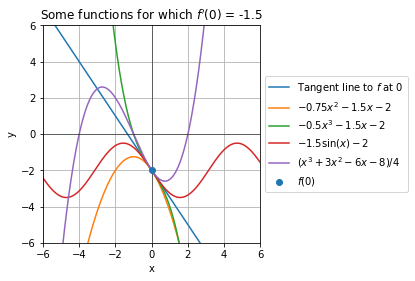

In [21]:
plot_function(tangent_line_at_point(func, func_derivative, 0), label="Tangent line to $f$ at 0")
plot_function(lambda x: -0.75 * x ** 2 - 1.5 * x - 2, label="$-0.75x^2 - 1.5x - 2$")
plot_function(lambda x: -0.5 * x ** 3 - 1.5 * x - 2, label="$-0.5x^3 - 1.5x - 2$")
plot_function(lambda x: -1.5 * np.sin(x) - 2, label="$-1.5\sin(x)-2$")
plot_function(func, label="$(x^3+3x^2-6x-8) / 4$")
plt.scatter([0], func(0), zorder=6, label="$f(0)$")
plot_config(title="Some functions for which $f'(0)$ = -1.5", bbox_to_anchor=(1, 0.5), legend_loc="center left")
plt.show()

This (and in other problems too) is where we can use higher order derivatives to provide us with additional information about the function around our point ($x=0$).

The second derivative's interpretation with respect to the tangent line tells us how the slope is changing. So the first derivative was the slope and the second derivative is the change in the slope. This is expected because the second derivative is nothing more that the derivative of the first derivative. It's notation is as follows: $$ f''(x) = \frac{{d(\frac{{df}}{{dx}})}}{{dx}} = \frac{{d^2f}}{{dx^2}} $$ 
The way we can see the change of the slope at a glance is to think about the curvature of the graph of $f(x)$. 

In [22]:
animate_tangent_line_of_function(func, point_x_lim=(-1, 2))

As we can see from the animation above, at points where the graph curves upwards like for this particular function for example in the interval $(-1, 2)$, the slope is increasing and that means that the second derivative is positive $(f''(x)>0)$. At points where it is curving downwards the slope is decreasing, so the second derivative is negative $(f''(x)<0)$.

In [23]:
animate_tangent_line_of_function(func, point_x_lim=(-4, -2))

For example a graph like the first one below ("Thin Curve") has a very large positive second derivative at the point 0: $\frac{{d^2f}}{{dx^2}}(0) = 400$, since the slope is very rapidly increasing around that point. But the second graph ("Thick Curve") still has a positive second derivative at the same point $x=0$, but it's a lot smaller, since the slope is only increasing slowly. ($\frac{{d^2g}}{{dx^2}}(0) = 9$). We can also see that if we just look at the first deriva
tive at both functions at that point, they are both equal to $0$ and the tangent line is parallel to the x-axis. From this information only we might think that both functions behave similarly around $0$, but this isn't the case. Having the information, provided to us by the second derivative, we can more accurately make assumptions about the function's behaviour. Now we know not only how the function is changing around that point (increasing, decreasing) but also at what rate. 

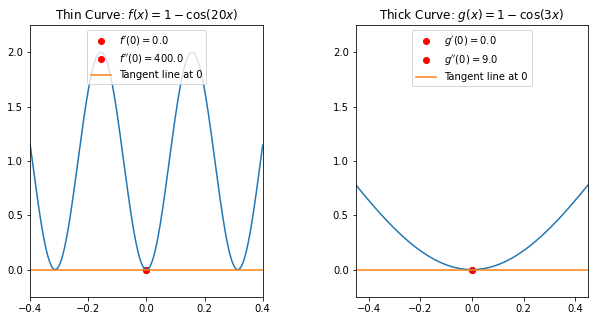

f'(0) = 0.0					g'(0) = 0.0
f''(0) = 400.0					g''(0) = 9.0


In [24]:
# Define the thick and thin curves using sympy's trigonometric functions
thick_curve = lambda x: 1 - sp.cos(3 * x)  # Adjust the frequency to control the thickness
thin_curve = lambda x: 1 - sp.cos(20 * x)  # Adjust the frequency to control the thinness

# Calculate the first and second derivatives of the curves using sympy
thick_first_derivative = get_function_derivative(thick_curve)
thick_second_derivative = get_function_derivative(thick_curve, order=2)
thin_first_derivative = get_function_derivative(thin_curve)
thin_second_derivative = get_function_derivative(thin_curve, order=2)

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# Plot the thin curve and its tangent line at x=0
plot_function(thin_curve, ax=ax1, x_lim=(-0.4, 0.4), y_lim=(-0.25, 2.25))
ax1.scatter(0, thin_curve(0), color="r", label=f"$f'(0)={thin_first_derivative(0)}$")
ax1.scatter(0, thin_curve(0), color="r", label=f"$f''(0)={thin_second_derivative(0)}$")
plot_function(tangent_line_at_point(thin_curve, thin_first_derivative, 0), label="Tangent line at 0", x_lim=(-0.4, 0.4), y_lim=(-0.25, 2.25), ax=ax1)
ax1.set_title("Thin Curve: $f(x) = 1 - \cos(20x)$")

# Plot the thick curve and its tangent line at x=0
plot_function(thick_curve, ax=ax2, x_lim=(-0.45, 0.45), y_lim=(-0.01, 0.12))
ax2.scatter(0, thick_curve(0), color="r", label=f"$g'(0)={thick_first_derivative(0)}$")
ax2.scatter(0, thick_curve(0), color="r", label=f"$g''(0)={thick_second_derivative(0)}$")
plot_function(tangent_line_at_point(thick_curve, thick_first_derivative, 0), label="Tangent line at 0", x_lim=(-0.45, 0.45), y_lim=(-0.25, 2.25), ax=ax2)
ax2.set_title("Thick Curve: $g(x) = 1 - \cos(3x)$")

# Adjust the spacing between subplots and add legends
plt.subplots_adjust(wspace=0.4)
ax1.legend(loc="upper center")
ax2.legend(loc="upper center")
plt.show()

# Print the values of the first and second derivatives at x=0
print(f"f'(0) = {thin_first_derivative(0)}" + f"\t\t\t\t\tg'(0) = {thick_first_derivative(0)}")
print(f"f''(0) = {thin_second_derivative(0)}" + f"\t\t\t\t\tg''(0) = {thick_second_derivative(0)}")

But let's get back to our original function, which we were looking at: $f(x) = \frac{x^3+3x^2-6x-8}{4}$.

It's first derivative as we already saw was equal to $f'(0) = -1.5$. It's second derivative is the function:

In [25]:
sp.diff(func(x_sym), x_sym, 2)

3*(x + 1)/2

So if we evaluate that for $x = 0$, we get $f''(0) = 1.5$. And now for our point of interest we have three distinct values, which we can use to make our approximation:
$$ f(0) = -2 $$
$$ f'(0) = -1.5 $$
$$ f''(0) = 1.5 $$

Let's look again at our function:

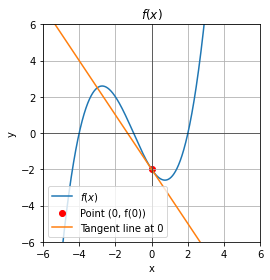

In [26]:
plot_function(func, label="$f(x)$")
plt.scatter(0, func(0), color='red', label='Point (0, f(0))')
plot_function(tangent_line_at_point(func, func_derivative, 0), label="Tangent line at 0")

plot_config(title="$f(x)$")

The first derivative at the point zero gives us the slope of the tangent line at that point. But if we want to accurately approximate the function at that point we should look not only at the first derivative as we saw already, because that wouldn't be nearly enough. The graph of $f'$ looks like this:

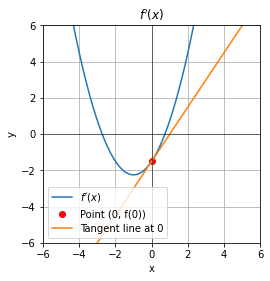

In [27]:
plot_function(func_derivative, label="$f'(x)$")
plt.scatter(0, func_derivative(0), color='red', label='Point (0, f(0))')
func_second_derivative = get_function_derivative(func, 2)
plot_function(tangent_line_at_point(func_derivative, func_second_derivative, 0), label="Tangent line at 0")

plot_config(title="$f'(x)$")

The second derivative of a function represents the rate of change or slope of the tangent line to the graph of the first derivative at a specific point. This valuable information enhances our ability to construct more accurate approximations, as it provides insights into the behavior of the first derivative. By obtaining a better approximation for the first derivative, we can subsequently improve our approximation for the original function. This concept can be extended to higher-order derivatives as well. The third derivative provides information about the second derivative, allowing us to refine our approximation of the first derivative, which in turn reveals more about the original function. This iterative process continues, with each higher-order derivative providing additional details for more precise approximations.

* Just to get a better understanding of the meaning of the second derivative specifically it is very useful to know that it represents acceleration. Having some movement along a line, suppose we fave a function $s(t)$ that records the distance traveled vs. time. Let's suppose that its graph looks something like the first plot below. Then its derivative $$\frac{ds}{dt}(t) = v(t)$$ tells us the velocity at each point in time. For example the graph here looks like a bump, increasing up to some maximum and than decreasing back to 0. So the second derivative tells us the rate of change for the velocity, which is the acceleration at each point in time. $$\frac{d^2s}{dt^2}(t) = a(t)$$ In this example the second derivative is positive for the first half of the journey, which indicates that the velocity increases. A negative second derivative indicates slowing down. The third derivative is called "Jerk". If the jerk is not zero, it means that the strength of the acceleration itself is changing.

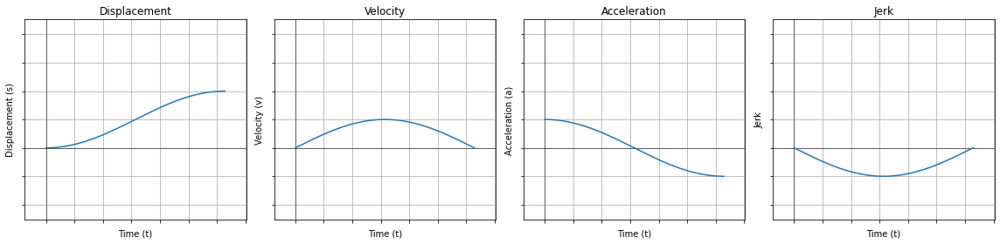

In [28]:
# Generate time values
t = np.linspace(0, np.pi, 100)

# Define functions for displacement and than velocity, acceleration and jerk as its derivatives
def displacement(t):
    return sp.sin(t - np.pi / 2) / 2 + 0.5

velocity = get_function_derivative(displacement)
acceleration = get_function_derivative(displacement, 2)
jerk = get_function_derivative(displacement, 3)

# Create the subplots
fig, axis = plt.subplots(1, 4, figsize=(16, 4))

# Plot displacement
plot_config(ax=axis[0], xlabel="Time (t)", ylabel="Displacement (s)", title="Displacement", show_legend=False)
plot_function(displacement, ax=axis[0], x_lim=(0, np.pi), y_lim=(0, 1))

# Plot velocity
plot_config(ax=axis[1], xlabel="Time (t)", ylabel="Velocity (v)", title="Velocity", show_legend=False)
plot_function(velocity, ax=axis[1], x_lim=(0, np.pi), y_lim=(0, 1))

# Plot acceleration
plot_config(ax=axis[2], xlabel="Time (t)", ylabel="Acceleration (a)", title="Acceleration", show_legend=False)
plot_function(acceleration, ax=axis[2], x_lim=(0, np.pi), y_lim=(0, 1))

# Plot jerk
plot_config(ax=axis[3], xlabel="Time (t)", ylabel="Jerk", title="Jerk", show_legend=False)
plot_function(jerk, ax=axis[3], x_lim=(0, np.pi), y_lim=(0, 1))

for ax in axis:
    ax.set_yticklabels([])
    ax.set_xticklabels([])

# Adjust spacing between subplots
plt.tight_layout()
# Show the plot
plt.show()

As we already saw, higher order derivatives can help us a lot when approximating functions. Let's now see how this is done in practice.

## 5. Polynomial approximations of functions. Taylor Series

### Approximating $\cos(x)$ around $x=0$

As we already discussed, polynomial approximations using power series (Taylor polynomials and Taylor series) are widely used in a lot of places. Specifically in physics for example a lot of problems formulas include trigonometric functions like $\cos$ and $\sin$, which make them difficult to compute. So let's start by trying to approximate $\cos$ around $x=0$ with a polynomial, by taking a look at it's graph.

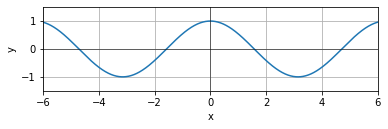

In [29]:
plot_function(np.cos, y_lim=(-1.5, 1.5))
plot_config(show_legend=False)

Say we want to construct a quadratic approximation around a given point (for now we are only focusing on $x=0$). We have to find the best polynomial among all of the possible quadratic polynomials, which most resembles $\cos(x)$ near $x=0$. $$ P(x) = c_0 + c_1x + c_2x^2 $$
Well first of all the actual value of $\cos(x)$ at $x=0$ is $\cos(0)=1$. So if our approximation is any good it would have to also intersect the y-axis at $y=1$. So when we evaluate our polynomial for $x=0$ we would have to get $P(0) = 1$. Let's expand on that: $$ P(0) = c_0 + c_10 + c_20^2 = c_0 $$
And we want $P(0)$ to equal $1$, so from this we get that $c_0 = 1$. Now our approximation polynomial looks like this: $$ P(x) = 1 + c_1x + c_2x^2 $$
We now have to choose the constants $c_1$ and $c_2$, but an important thing to note is that <b>nothing</b> we do with them is going to change the fact that $P(0) = 1$. The animation bellow illustrates exactly that.

In [30]:
def quad(a, b, c):
    return lambda x: a * x ** 2 + b * x + c

In [31]:
fig, ax = plt.subplots()

x_vals = np.linspace(-5, 5, 100)

parabula, = plot_function(quad(1, 2, 1))
plt.scatter(0, 1, color="r")

a_values = np.linspace(-5, 5, 100)  # Sequence of values for 'a'
b_values = np.linspace(-5, 5, 100)  # Sequence of values for 'b'

def update(frame):
    a = frame // 11 - 5
    b = frame % 11 - 5
    parabula.set_data(x_vals, quad(a, b, 1)(x_vals))
    ax.set_title(f"Polynomial: $P(x) = {a}x^2 + {b}x + 1$")
    return [parabula]

num_frames = 11 * 11
animation = FuncAnimation(fig, update, frames=num_frames, interval=50, blit=True)
plot_config(show_legend=False)

plt.close(fig)
HTML(animation.to_jshtml())

Now as we already discussed to take the derivatives of the function around the point of interest is very useful. Ultimately we would like for the approximation function to have the same value for every derivative as the original function at that point. In terms of the first derivative, we would like our approximation function, centered around 0 to have the same tangent slope as $\cos(x)$ at our point of interest. Otherwise the approximation drifts away much faster from the $\cos$ graph than it needs to as we can see from the plot below. The red polynomial isn't very accurate, while the green one, is a lot closer to the actual graph of the function, because they have the same tangent line slope at $x=0$.

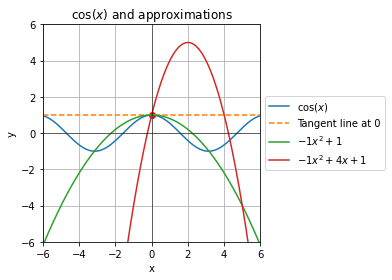

In [32]:
plt.scatter(0, 1, color='red')
plot_function(np.cos, label="$\cos(x)$")
plot_function(tangent_line_at_point(np.cos, get_function_derivative(sp.cos), 0), label="Tangent line at 0", linestyle="--")
plot_function(quad(-0.2, 0, 1), label="$-1x^2+1$")
plot_function(quad(-1, 4, 1), label="$-1x^2+4x+1$")
plot_config(title="$\cos(x)$ and approximations", bbox_to_anchor=(1, 0.5), legend_loc="center left")

The derivative of $\cos$ is: $$ \frac{d(\cos)}{dx}(x)=-\sin(x) $$
And for $x=0$ that evaluates to: $cos'(0) = -sin(0) = 0$. This means that the tangent line as we can see from the plot above is perfectly flat. We now want to make our polynomial have the same value for it's derivative at $0$.
$$ P(x) = 1 + c_1x + c_2x^2 $$
$$ P'(x) = (1)' + c_1(x)' + c_2(x^2)' $$
$$ P'(x) = 0 + c_1 + c_22x = c_1 + 2c_2x $$
And at $x=0$ this just equals whatever we choose for $c_1$.  $$P'(0) = c_1 + 2c_20 = c_1$$
So this constant $c_1$ fully controls the derivative of our approximation around $x=0$. And if we want $P'(x) = cos'(x)$ we just have to set $c_1=0$. So now our polynomial looks like this: $$ P(x) = 1+ 0x + c_2x^2 = 1 + c_2x^2$$
By setting $c_1 = 0$ we make sure that $P(x)$ also has a flat tangent line at $x=0$. We now only have to find an appropriate value for $c_2$, but again whatever we choose for this constant won't effect the value and the slope of the polynomial at that point of interest. They are now <b>"locked in place"</b> and match those of $\cos(x)$ as we can see from the animation below. 

In [33]:
fig, ax = plt.subplots()

x_vals = np.linspace(-6, 6, 100)

# Plot a red dot at (0, 1)
plt.scatter(0, 1, color='red')

# Plot the cosine function
plot_function(np.cos, label="$\cos(x)$", ax=ax)

# Plot the tangent line at x=0
plot_function(tangent_line_at_point(np.cos, get_function_derivative(sp.cos), 0), \
              label="Tangent line at 0", linestyle="--", ax=ax)

# Plot the initial approximation curve
approx, = plot_function(quad(-0.2, 0, 1), ax=ax, y_lim=(-6.5, 6.5), x_lim=(-6, 6))

def update(frame):
    # Update the coefficients of the quadratic approximation
    a = x_vals[frame]
    approx.set_data(x_vals, quad(a, 0, 1)(x_vals))
    ax.set_title(f"$\cos(x)$ and $P(x) = {a:.2f}x^2+1$")
    ax.set_ylim(-6, 6)
    return [approx]

# Create the animation by updating the approximation curve
animation = FuncAnimation(fig, update, frames=len(x_vals), interval=100, blit=True)

# Configure the plot settings
plot_config(show_legend=False, bbox_to_anchor=(1, 0.5), legend_loc="center left", ax=ax)
plt.close(fig)

# Display the animation as HTML
HTML(animation.to_jshtml())

The final thing to consider is the curvature of the cosine graph around $x=0$. It curves downwards, meaning that it has a negative second derivative $cos''(x) < 0$ around $x=0$ (the slope of the tangent line (the rate of change) is decreasing around that point). We can calculate it's second derivative at that point and choose a value for $c_2$, which makes the second derivative of our polynomial equal to the one of $\cos(x)$ at the point of interest. In the same way that we wanted the first derivatives to match up so that the polynomial's values wouldn't drift apart too quickly, making sure that their second derivatives also match will ensure that they curve at the same rate around $x=0$ (that the slope of our approximation doesn't drift away from the slope of the $\cos(x)$ more quickly than it needs to).   
$$ \frac{d^2(\cos)}{dx^2}(x)=-\sin(x) $$ 
And for $x=0$ we get that: $\cos''(0) = -cos(0) = -1$.

If we take the derivative of $P'(x)$, we will get the second derivative of the polynomial ($P''(x)$).
$$ P'(x) = \frac{d(1 + c_2x^2)}{dx} = 0 + 2c_2x = 2c_2x $$
$$ P''(x) = \frac{d(2c_2x)}{dx} = 2c_2 $$
So we now want to make sure that $P''(0) = cos''(0)$.
$$ 2c_2 = -1 $$
$$ c_2 = -\frac{1}{2} $$

We now have the quadratic approximation for $\cos(x)$: $P(x) = c_0 + c_1x + c_2x^2 = 1 + 0x + (-\frac{1}{2})x^2 = 1 + (-\frac{1}{2})x^2 $, which looks like this:

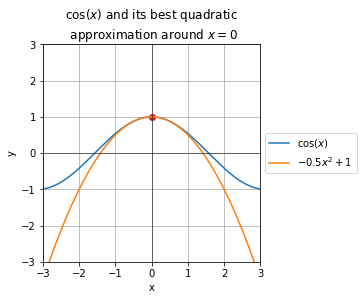

In [34]:
plt.scatter(0, 1, color='red')
plot_function(np.cos, label="$\cos(x)$")
plot_function(quad(-0.5, 0, 1), label="$-0.5x^2+1$", y_lim=(-3, 3), x_lim=(-3, 3))
plot_config(title="$\cos(x)$ and its best quadratic\n approximation around $x=0$", \
            bbox_to_anchor=(1, 0.5), legend_loc="center left")

Let's reflect on what we just did here. With this quadratic approximation we had three degrees of freedom - the constant coefficients: $c_0, c_1, c_2$.
* $c_0$ was responsible for making sure that the output of the approximation at the point of interest ($x=0$) matches that of the original function ($\cos(x)$) $$ P(0) = cos(0) $$
* $c_1$ made sure that the derivatives of the approximation and the target function at that point were also identical $$ \frac{dP}{dx}(0) = \frac{d(cos)}{dx}(0) $$
* $c_2$ was responsible for making sure that the second derivatives match up $$ \frac{d^2P}{dx^2}(0) = \frac{d^2(cos)}{dx^2}(0) $$

We ensured that the values at that point ($x=0$), how they change and how the rate of change itself changes are as similar as possible for the approximation polynomial and $\cos(x)$, given the amount of control that we have (a polynomial of second degree).

How those three coefficients change our approximation and more importantly the fact that they <b>don't affect one another</b> is illustrated below by the three plots, which you could play with to get a better feel of their effect. 

In [35]:
c0, c1, c2 = 1, 0, -0.5

def update_plot(new_c0, new_c1, new_c2):
    fig = plt.figure(figsize=(13.5, 4))

    plt.subplot(1, 3, 1)
    plt.scatter(0, 1, color='red')
    plot_function(np.cos, label="$\cos(x)$")
    plot_function(quad(c2, c1, new_c0), y_lim=(-3, 3), x_lim=(-3, 3))
    plot_config(title=f"P(x) with varying coefficient $c_0$ \n $P(x) = {c2}x^2 + {c1}x + {new_c0}$", show_legend=False)

    plt.subplot(1, 3, 2)
    plt.scatter(0, 1, color='red')
    plot_function(np.cos, label="$\cos(x)$")
    plot_function(quad(c2, new_c1, c0), y_lim=(-3, 3), x_lim=(-3, 3))
    plot_config(title=f"P(x) with varying coefficient $c_1$ \n $P(x) = {c2}x^2 + {new_c1}x + {c0}$", show_legend=False)


    plt.subplot(1, 3, 3)
    plt.scatter(0, 1, color='red')
    plot_function(np.cos, label="$\cos(x)$")
    plot_function(quad(new_c2, c1, c0), y_lim=(-3, 3), x_lim=(-3, 3))
    plot_config(title=f"P(x) with varying coefficient $c_2$ \n $P(x) = {new_c2}x^2 + {c1}x + {c0}$", show_legend=False)

    plt.tight_layout()

c0_slider = widgets.FloatSlider(value=c0, min=-5, max=5, step=0.1, description='$c_0$')
c1_slider = widgets.FloatSlider(value=c1, min=-5, max=5, step=0.1, description='$c_1$')
c2_slider = widgets.FloatSlider(value=c2, min=-5, max=5, step=0.1, description='$c_2$')

input_ui = widgets.HBox([c0_slider, c1_slider, c2_slider])
out = widgets.interactive_output(update_plot, {'new_c0': c0_slider, 'new_c1': c1_slider, 'new_c2': c2_slider})
display(out, input_ui)

Output()

Let's see how accurate our approximation is for values close to 0. If we estimate $\cos(0.1)$ with this polynomial we will get the following results:

In [36]:
cos_quad_approximation = quad(c2, c1, c0)

In [37]:
def relative_error(approximation_func, true_func):
    """
    Calculates the relative error between an approximation function and a true function.

    Parameters:
        approximation_func (callable): The approximation function.
        true_func (callable): The true function.

    Returns:
        callable: A function that calculates the relative error for a given input.

    """
    def calculate_relative_error(x):
        approx_value = np.abs(approximation_func(x))
        true_value = np.abs(true_func(x))
        
        error = np.abs(true_value - approx_value)
        relative_error = (error / true_value) * 100
        
        return relative_error
    
    return calculate_relative_error

In [38]:
def print_error_for(value, approximation_function, target_function):
    approx_value = approximation_function(value)
    true_value = target_function(value)
    error = relative_error(approximation_function, target_function)(value)
    absolute_error = true_value - approx_value

    print("Error for: x =", value)
    print("Approximation value:", approx_value)
    print("True value:", true_value)
    print(f"Relative error: {error:.7f}%")
    print(f"Absolute error:: {absolute_error:.20f}")
    
print_error_for(0.1, cos_quad_approximation, np.cos)

Error for: x = 0.1
Approximation value: 0.995
True value: 0.9950041652780258
Relative error: 0.0004186%
Absolute error:: 0.00000416527802582500


We can see that for a value this close to zero the approximation is very good (it has an error of only 0.0004%). For small values (for example $x\in[-5; 5]$) the approximation has again a very small relative error as we can see from the plot below, which means that it is really good. (We measured the error by the absolute value of the difference between the approximated value and the true value of the function at the requested point and then calculated a relative error as the error divided by the true value).

In [39]:
def plot_relative_error(approximation_function, target_function, x_lim=(-0.5, 0.5), y_lim=(-0.5, 0.5)):
    approximation_error = relative_error(approximation_function, target_function)
    plot_function(approximation_error, x_lim = x_lim, y_lim = y_lim)
    plot_config(show_legend=False, title=f"Relative Error between ${sp.latex(approximation_function(x_sym))}$ and ${sp.latex(target_function(x_sym))}$", ylabel="Relative Error (%)")
    plt.show()

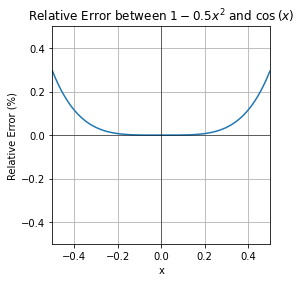

In [40]:
# We pass sp.cos instead of np.cos, because the plot title is automatically generated using sympy
plot_relative_error(cos_quad_approximation, sp.cos)

But we can enhance the approximation, by adding more terms to the polynomial and matching up higher order derivatives. For example we can add $c_3x^3$:
$$ P(x) = 1 - \frac{1}{2}x^2 + c_3x^3 $$
Well in that case if we take the third derivative of a cubic polynomial, anything that's quadratic or smaller goes to 0. And as for the last term after three iterations of the power rule it looks like $1.2.3.c_3$.
$$ \frac{d^3P}{dx^3}(x) = \frac{d^3(1 - \frac{1}{2}x^2)}{dx^3} + \frac{d^3(c_3x^3)}{dx^3} = 0 + 1.2.3.c_3 = 6.c_3  $$
On the other hand the third derivative of $\cos(x)$ is equal to $\sin(x)$, which at $x=0$ is also equal to $0$.
$$ \frac{d^3(\cos)}{dx^3}(0) = \sin(0) = 0 $$
So to make sure that the third derivatives match, the constant $c_3$ should be equal to $0$.
$$ \frac{d^3P}{dx^3}(0) = \frac{d^3(\cos)}{dx^3}(0) $$
$$ 6.c_3 = 0 $$
$$ c_3 = 0 $$
Or in other words not only is $ P(x) = 1 - \frac{1}{2}x^2 $ the best possible quadratic approximation of $\cos$, it is also the best possible <em>cubic</em> approximation. 

We can actually make an improvement by adding a fourth order term: $c_4x^4$.
$$ P(x) = 1 - \frac{1}{2}x^2 + c_4x^4 $$
Again we go through the same process:
$$ \frac{d^4(\cos)}{dx^4}(0) = \cos(0) = 1 $$
For the fourth derivative of the polynomial we again apply the power rule for the last term over and over (all cubic and smaller terms have a forth derivative = to 0)
$$ \frac{d^4P}{dx^4}(x) = \frac{d^4(1 - \frac{1}{2}x^2)}{dx^4} + \frac{d^4(c_4x^4)}{dx^4} = 0 + 1.2.3.4.c_4 = 24.c_4  $$
So if we want this to match the forth derivative of $\cos(x)$, which is for $x=0$ is $1$, $c_4$ has to be $\frac{1}{24}$
$$ \frac{d^4P}{dx^4}(0) = \frac{d^4(\cos)}{dx^4}(0) $$
$$ 24.c_4 = 1 $$
$$ c_4 = \frac{1}{24} $$
And indeed the new approximating polynomial: $ P(x) = 1 - \frac{1}{2}x^2 + \frac{1}{24}x^4 $ is a <b>very</b> close approximation for $\cos(x)$ around $x=0$.

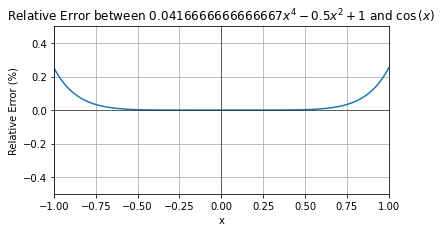

Error for: x = 0.4
Approximation value: 0.9210666666666666
True value: 0.9210609940028851
Relative error: 0.0006159%
Absolute error:: -0.00000567266378148634


In [41]:
fourth_power_cos_approximation = lambda x: 1 - 0.5 * x ** 2 + (1 / 24) * x ** 4
plot_relative_error(fourth_power_cos_approximation, sp.cos, x_lim=(-1, 1))
print_error_for(0.4, fourth_power_cos_approximation, np.cos)

We can see form the plot above that the error is indeed very small for an even larger range of values than before. With the quadratic polynomial we got almost the same approximation error for $x=0.1$ as with the new polynomial of the fourth degree for $ x=0.4 $ (four times larger value). In any physics problem for example involving the $\cos$ of a small angle - predictions, calculated using this polynomial are almost unnoticeably different. 

### Generalization for $x=0$. Maclaurin series

Let's mark down a few key points about the process of approximating $\cos(x)$, which we just went through.
1. Factorial terms come very naturally as a part of this process.
    Let's suppose that we have the polynomial $P(x) = c_0 + c_1x + c_2x^2 + c_3x^3 + \dots + c_nx^n $ which is of degree $n$ and has real coefficients $c_0, c_1, c_2, \dots, c_n $.

    If we take $n$ successive derivatives of the term $c_nx^n$, letting the power rule just keep cascading on down, what we are left with is $(1.2.3.\dots.n)c_n = n!c_n$
    For example for n = 5, this looks like this:
    $$ \frac{d(c_5x^5)}{dx} = 5c_5x^4 $$
    $$ \frac{d^2(c_5x^5)}{d^2x} = 4.5.c_5x^3 $$
    $$ \frac{d^3(c_5x^5)}{d^3x} = 3.4.5.c_5x^2 $$
    $$ \frac{d^4(c_5x^5)}{d^4x} = 2.3.4.5.c_5x $$
    $$ \frac{d^5(c_5x^5)}{d^5x} = 1.2.3.4.5.c_5 = 5!c_5 $$

    So we can generalize that for a constant coefficient $c_k$,$$ \frac{d^k(c_kx^k)}{d^kx} = k!c_k $$
    
2. As we already saw, when we want to approximate an arbitrary function $f$ around a point of interest (in our case for now $x=0$) with a polynomial of degree $n$, we try to choose coefficients for the polynomial so that the derivatives at that point for our polynomial and the target function have equal values. We can just choose the coefficients one by one for each term by matching it up with the corresponding value of the derivative. For $x=0$ this looks like this:
    
    Let's work again with the same polynomial $P(x)$ of degree $n$ from 1. and suppose that we want to approximate the function $f$ (which is infinitely differentiable).
    For any given coefficient $c_k$ ($0<k\leq n$), responsible for the term containing, $x^k$, we can see that the value of the $k$-th derivative of this polynomial at $x=0$ depends only on that specific term $c_kx^k$:
    
    $$ \frac{d^kP}{d^kx}(0) = 
    \underbrace{\frac{d^k(c_0)}{d^kx}(0) + \frac{d^k(c_1x)}{d^kx}(0) + \frac{d^k(c_2x^2)}{d^kx}(0) + \dots }_{\large\text{All = 0, because for any a > b }\frac{d^a(x^b)}{d^ax}\text{ = 0}} 
    + \frac{d^k(c_kx^k)}{d^kx}(0) 
    + \underbrace{\dots + \frac{d^k(c_{k+1}x^{k+1})}{d^kx}(0) + \frac{d^k(c_{k+2}x^{k+2})}{d^kx}(0) + \dots + \frac{d^k(c_{n}x^{n})}{d^kx}(0)}_{\large\text{All = 0, because for any a < b }\frac{d^a(x^b)}{d^ax} \text{ = something}.x^{b-a}\underset{\substack{
        \normalsize x = 0
    }}{=}0} = k!c_k $$
    
    So new can notice that adding new terms, like for example here if we were to add another term: $c_{n+1}x^{n+1}$, it wouldn't mess up what the old terms (coefficients) should be. From the equation above we can see that because we are evaluating at $x=0$, each derivative of a polynomial at $x=0$ is controlled by <b>one and only one</b> of the coefficients. This allows us to add as many terms to the polynomial, as we desire (keeping in mind that if we want to make an approximation with a polynomial of degree $k$, $f$ would have to be differentiable $k$ times, which isn't always the case).

So if we want to make the best polynomial approximation for the function $f$ with a polynomial $P$ of degree $n$ with real coefficients $c_0, c_1, c_2, \dots, c_n$ ($P(x) = c_0 + c_1x + c_2x^2 + c_3x^3 + \dots + c_nx^n $) around $x=0$ we need to match:
1. The values for $P(0)$ and $f(0)$. Because $P(0) = c_0$, we set $c_0 = f(0)$ 
2. For any $k$ ($0<k\leq n$) we want the value of the $k$-th derivative of $P$ at the point $x=0$ to be equal to the value of the $k$-th derivative of $f$ at $x=0$. As we already established: $ P^{(k)}(0) = k!c_k $. So if we want $f^{(k)}(0) = P^{(k)}(0)$ we get for each $c_k$: 
$$ k!c_k = f^{(k)}(0) $$ 
$$ c_k = \frac{f^{(k)}(0)}{k!} $$ 

Following these steps we get the following polynomial of degree $n$, approximation the function $f$.
$$ P(x) = f(0) + f'(0)x + \frac{{f''(0)}}{{2!}}x^2 + \frac{{f'''(0)}}{{3!}}x^3 + \cdots + \frac{{f^{(n)}(0)}}{{n!}}x^n = \sum_{k=0}^{n} \frac{{f^{(k)}(0)}}{{k!}}x^k $$ 
\* By definition $f^{(0)}(a) = f(a)$ and $0! = 1$, so we can just say that $c_0 = f(0) = \frac{f^{(0)}(0)}{0!}$

This is called a <b>Maclaurin polynomial</b> - a polynomial approximation of a finite degree of a function centered at $x=0$. As the degree of the polynomial increases, the approximation becomes more accurate. We then can allow the Maclaurin polynomial to contain an infinite number of terms in it's expansion:
$$P(x) = f(0) + f'(0)x + \frac{{f''(0)}}{{2!}}x^2 + \frac{{f'''(0)}}{{3!}}x^3 + \cdots = \sum_{n=0}^{\infty} \frac{{f^{(n)}(0)}}{{n!}}x^n$$
We call this a <b>Maclaurin series</b>. The Maclaurin series for a whole class of functions actually converges to the actual function over the entire domain of $x$ and for others only in a specific interval. We will later dive deeper into the convergence issues, but for now, believing that it actually converges to $\cos$ over the entire domain, we can rewrite $\cos(x)$ as:
$$ \cos(x) =
\sum_{n=0}^{\infty} \frac{{\cos^{(n)}(0)}}{{n!}}x^n 
\underset{\substack{
        \Large\uparrow \\
        \normalsize cos(0)\text{ = }cos(0)\text{ = }1 \\
        \normalsize cos'(0)\text{ = }-sin(0)\text{ = }0 \\
        \normalsize cos''(0)\text{ = }-cos(0)\text{ = }-1 \\
        \normalsize cos^{(3)}(0)\text{ = }sin(0)\text{ = }0 \\
        \normalsize cos^{(4)}(0)\text{ = }cos(0)\text{ = }1 \\
        \normalsize cos^{(5)}(0)\text{ = }-sin(0)\text{ = }0 \\
    }}{=}
1 - \frac{{x^2}}{2!} + \frac{{x^4}}{4!} - \frac{{x^6}}{6!} + \frac{{x^8}}{8!} - \frac{{x^{10}}}{10!} + \dotsb =
\sum_{n=0}^{\infty} \frac{(-1)^n}{(2n)!}x^{2n} $$

But what if we want to approximate a function around a different point, not only $x=0$?

### Generalization for x = a. Taylor Series

We will now see that the Maclaurin series is actually just a specific example of the Taylor series, which are just a specific example for a power series. 

As we already discussed, a very important property of the polynomials at $x=0$ is controlled by one and only one coefficient of the polynomial. This is very important for our approximation to actually work. So if instead we were approximation near an input other than 0, like $x=a$, in order to get the same effect, we would have to write our polynomial in terms of powers of $(x-a)$:
$$ P_a(x) = c_0 + c_1(x-a)^1 + c_2(x-a)^2 + c_3(x-a)^3 + c_4(x-a)^4 + c_5(x-a)^5 + \cdots $$
This looks a bit different, but all we are doing is making sure that the point $a$ looks and behaves like $0$. Here if we were to plug in $x=a$ into the polynomial we would get all the same cancellations as we did before when taking higher order derivatives of that polynomial:

For any given coefficient $c_k$ ($0<k\leq n$), responsible for the term containing, $x^k$, we can see that the value of the $k$-th derivative of this polynomial at $x=0$ depends only on that specific term $c_kx^k$:

$$ 
\frac{d^kP_a}{d^kx}(a) = 
\underbrace{\frac{d^k(c_0)}{d^kx}(a) + \frac{d^k(c_1(x-a)^1)}{d^kx}(a) + \frac{d^k(c_2(x-a)^2)}{d^kx}(a) + \dots }_{\large\text{All = 0, because for any a > deg(P), } P^{(a)}\text{ = 0}} 
+ \frac{d^k(c_k(x-a)^k)}{d^kx}(a) 
+ \underbrace{\dots + \frac{d^k(c_{k+1}(x-a)^{k+1})}{d^kx}(a) + \frac{d^k(c_{k+2}(x-a)^{k+2})}{d^kx}(a) + \dots + \frac{d^k(c_{n}(x-a)^{n})}{d^kx}(a)}_{\large\text{All = 0, because for any a < b }\frac{d^a(x^b)}{d^ax} \text{ = something}.(x-a)^{b-a}\underset{\substack{
    \normalsize x = a \rightarrow x-a=0
}}{=}0} = k!c_k 
$$

And now we can make general approximations of a function around any given point, by assigning the values for the coefficients of the polynomial $P_a(x)$ just as we did before.
$$ P(x) = f(a) + f'(a)(x-a) + \frac{{f''(a)}}{{2!}}(x-a)^2 + \frac{{f'''(a)}}{{3!}}(x-a)^3 + \dotsb + \frac{{f^{(n)}(a)}}{{n!}}(x-a)^n = \sum_{k=0}^{n} \frac{{f^{(k)}(a)}}{{k!}}(x-a)^k $$

We call this polynomial approximation of degree $n$ of the function $f$ around the point of interest $x=a$ a <b>Taylor polynomial</b>.

Similarly as with Maclaurin polynomials, we can make the approximation more accurate by adding more terms to the polynomial. And again we can consider adding infinitely many terms, which will give us the <b>Taylor Series</b> (a series is an infinite sum):
$$ f(a) + \frac{{f'(a)}}{{1!}}(x - a) + \frac{{f''(a)}}{{2!}}(x - a)^2 + \frac{{f'''(a)}}{{3!}}(x - a)^3 + \cdots 
= \sum_{n=0}^{\infty} \frac{f^{(n)}(a)}{n!}(x - a)^n $$



Let's define a method, which calculates the n-th degree Taylor polynomial for a given function.

In [42]:
def taylor_poly_sym(function, point, degree):
    """
    Calculate the Taylor polynomial of a function around a given point up to a specified degree.

    Parameters:
        function (callable or sympy expression): The function to approximate.
        variable (sympy symbol): The variable with respect to which the Taylor polynomial is calculated.
        point (float or int): The point around which the Taylor polynomial is centered.
        degree (int): The degree of the Taylor polynomial.

    Returns:
        taylor_poly (sympy expression): The Taylor polynomial approximation of the function.
    """
    taylor_poly = 0
    for n in range(degree + 1):
        coeff = get_function_derivative_sym(function, n).subs(x_sym, point) / sp.factorial(n)
        term = coeff * (x_sym - point)**n
        taylor_poly += term

    return taylor_poly

def taylor_poly(function, point, degree):
    return sp.lambdify(x_sym, taylor_poly_sym(function, point, degree))

Now let's take a look at $\cos(x)$ and its first 7 different Taylor polynomials (of degrees 0, 2, 4, 6, 8, 10, 12). We can see that with more terms we get an accurate approximation for bigger and bigger intervals around 0. 

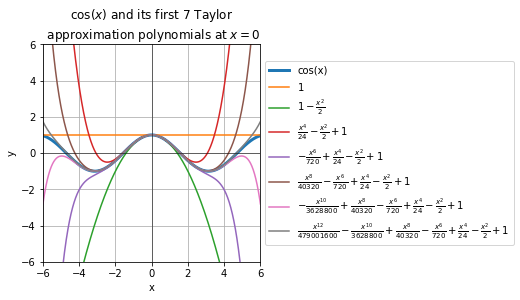

In [43]:
plot_function(sp.cos, label="cos(x)", linewidth=3)

for deg in range(0, 14, 2):
    plot_function(taylor_poly(sp.cos, 0, deg), label=f"${sp.latex(taylor_poly_sym(sp.cos, 0, deg))}$")
    
plot_config(title="$\cos(x)$ and its first 7 Taylor\n approximation polynomials at $x=0$", \
            bbox_to_anchor=(1, 0.5), legend_loc="center left")

And if we see the error for the polynomial of 8-th degree for example we can see that even for an $x$ as big as 2 we have only $0.07\%$ error in our approximation (the peaks in the plot are because the relative error is undefined for $\cos(\frac{\pi}{2})$).

Error for: x = 2
Approximation value: -0.41587301587301595
True value: -0.4161468365471424
Relative error: 0.0657991%
Absolute error:: -0.00027382067412645705


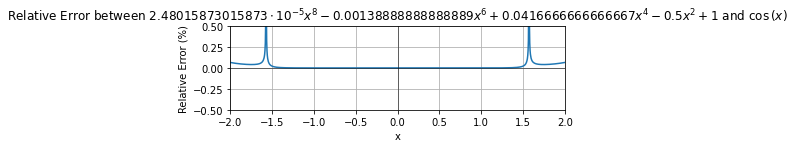

In [44]:
print_error_for(2, taylor_poly(sp.cos, 0, 8), np.cos)
plot_relative_error(taylor_poly(sp.cos, 0, 8), sp.cos, x_lim=(-2,2))

### Convergence and analytic functions

We say that a series <b>equals</b> the value that it is converging to. For example if we have the series:
$$ 1 + \frac{1}{2} + \frac{1}{2^2} + \frac{1}{2^3} + \cdots + \frac{1}{2^{n-1}} + \cdots $$
If we construct the sequence:
$$ a_1 = 1 $$
$$ a_2 = 1 + \frac{1}{2} $$
$$ a_3 = 1 + \frac{1}{2} + \frac{1}{4} $$
$$ \vdots $$
$$ a_n = 1 + \frac{1}{2} + \frac{1}{2^2} + \frac{1}{2^3} + \cdots + \frac{1}{2^{n-1}} $$
We say that the limit of that sequence (of the <em>partial sums</em>), if that limit exists, it <b>equals</b> the sum of the series or the series <b>converges</b> to its value. In other words:
$$ 1 + \frac{1}{2} + \frac{1}{2^2} + \frac{1}{2^3} + \cdots + \frac{1}{2^{n-1}} + \cdots = \lim_{n\to\infty}a_n  $$
If such limit doesn't exist, we say the series <b>diverges</b>. And to extend this definition for any arbitrary series:
$$ \sum_{n=0}^{\infty} a_n =
\lim_{k\to\infty}s_k =
\lim_{k\to\infty}\sum_{n=0}^{k} a_n $$

So by definition the Taylor series:
$$ \sum_{n=0}^{\infty} \frac{f^{(n)}(a)}{n!}(x - a)^n 
\underset{\substack{\normalsize\text{if the limit}\\\normalsize\text{exists}}}{=}
\lim_{k\to\infty}\sum_{n=0}^{k} \frac{{f^{(n)}(a)}}{{n!}}(x-a)^n $$

If the Taylor series (or power series in general) for a function converges for each $x \in (a-r, a+r)$ (or an open disk centered at $a$ in the complex plane), the function is said to be <b>analytic</b> in this region.
* If $f(x)$ is equal to the sum of its Taylor series for all $x$ in the real (and also can be extended to complex) plane, it is called <em>entire</em>.
    The polynomials, exponential function $e^x$, and the trigonometric functions $\sin$ and $\cos$, are examples of entire functions. In cases like these, we say that the function <b>equals</b> it's own Taylor series at all inputs $x$ (why are some functions analytic or entire and others not and how do we know which ones are which is beyond the scope of this notebook). Let's take a look at what that looks like for $e^x$

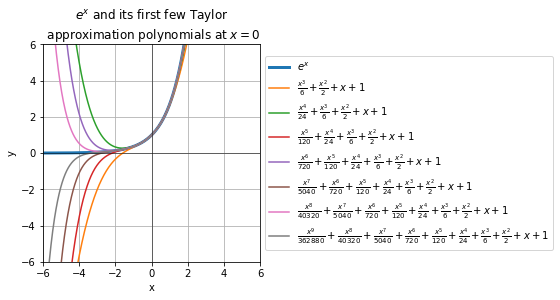

In [45]:
plot_function(sp.exp, label="$e^x$", linewidth=3)

for deg in range(3, 10):
    plot_function(taylor_poly(sp.exp, 0, deg), label=f"${sp.latex(taylor_poly_sym(sp.exp, 0, deg))}$")
    
plot_config(title="$e^x$ and its first few Taylor\n approximation polynomials at $x=0$", \
            bbox_to_anchor=(1, 0.5), legend_loc="center left")

* If the Taylor series diverges at $x$ when the distance between $x$ and the point of interest $b$ is large, the function $f$ isn't entire.
    Examples of such functions include the square root $\sqrt{x}$, the natural logarithm $\ln$, the trigonometric function tangent $\tan$ and its inverse, $\arctan$. Let's look at the $\ln(x)$ at $x=1$. We can see that when we plug in an input $x\in(0;2)$, adding more terms to the series will get us closer and closer to $\ln(x)$. But when we go outside of that range even by just a little bit, the series fails to approach anything. As we add on more and more terms, the sum just bounces back and forth wildly, it does not approach $\ln(x)$. In some sense the derivative information of $\ln(x)$ at $x=1$ doesn't propagate out that far. In this case we say that the series diverges. And that maximum distance between the input we're approximating near, and the points where the ouputs of these polynomials actually do converge is called the <b>"Radius of convergence"</b> - <em>$r$</em> for that Taylor series.

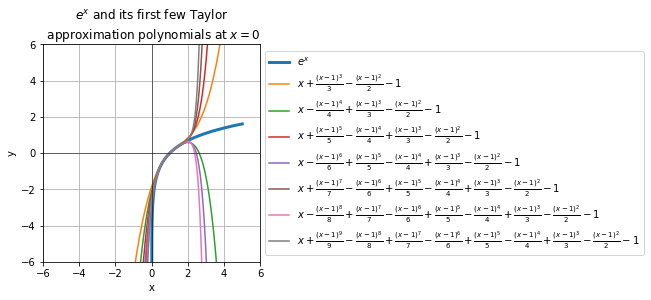

In [46]:
plot_function(sp.log, label="$e^x$", linewidth=3, x_lim=(0.00001, 5))

for deg in range(3, 10):
    plot_function(taylor_poly(sp.log, 1, deg), label=f"${sp.latex(taylor_poly_sym(sp.log, 1, deg))}$")
    
plot_config(title="$e^x$ and its first few Taylor\n approximation polynomials at $x=0$", \
            bbox_to_anchor=(1, 0.5), legend_loc="center left")

### Important Taylor expansions. Euler formula

As we already mentioned and can now clearly see: Maclaurin series are specific examples of Taylor series around the point $x=0$. Let's explore some of the more common functions' Maclaurin series representations.
* $e^x$ - One of the simplest meaningful examples of Taylor series is the expansions of $e^x$, around the input $x=0$. Computing its derivatives is easy, because the derivative of $e^x$ is itself. So the second derivative of $e^x$ is also $e^x$, as is its third, and so on. So at the point $x=0$, all of its derivatives equal 0.
$$ e^0 = \frac{d(e^x)}{dx}(0) = \frac{d^2(e^x)}{dx^2}(0) = \frac{d^3(e^x)}{dx^3}(0) = \frac{d^4(e^x)}{dx^4}(0) = \cdots = \frac{d^n(e^x)}{dx^n}(0) = 1 $$
And what that means is that our Taylor series approximation looks like:
$$ P(x) = 1 + 1\frac{x^1}{1!} + 1\frac{x^2}{2!} + 1\frac{x^3}{3!} + 1\frac{x^4}{4!} + \cdots = \sum_{n=0}^{\infty} \frac{x^n}{n!}$$
Also, we already saw that $e^x$ is analytical, so we can safely say that:
$$ e^x = 1 + \frac{x}{1!} + \frac{x^2}{2!} + \frac{x^3}{3!} + \frac{x^4}{4!} + \cdots $$

As we derived above, the Maclaurin series for $\cos(x)$ looks like this:
$$ \cos(x) =
1 - \frac{{x^2}}{2!} + \frac{{x^4}}{4!} - \frac{{x^6}}{6!} + \frac{{x^8}}{8!} - \frac{{x^{10}}}{10!} + \dotsb =
\sum_{n=0}^{\infty} \frac{(-1)^n}{(2n)!}x^{2n} $$
Using the formula, which we derived earlier and knowing that the derivatives of $\sin(x)$ are:


$$
sin(0)\text{ = }sin(0)\text{ = }0 \\
\downarrow \\
sin'(0)\text{ = }cos(0)\text{ = }1 \\
\downarrow \\
sin''(0)\text{ = }-sin(0)\text{ = }0 \\
\downarrow \\
sin^{(3)}(0)\text{ = }-cos(0)\text{ = }-1 \\
\downarrow \\
sin^{(4)}(0)\text{ = }sin(0)\text{ = }0 \\
\downarrow \\
sin^{(5)}(0)\text{ = }cos(0)\text{ = }1 \\
\downarrow \\
\vdots
$$

We can work out that the Maclaurin series for $\sin(x)$ is:
$$ sin(0) + sin'(0)x + \frac{{sin''(0)}}{{2!}}x^2 + \frac{{sin'''(0)}}{{3!}}x^3 + \frac{{sin^{(4)}(0)}}{{4!}}x^4 + \cdots = \\
= sin(0) + cos(0)x + \frac{{-sin(0)}}{{2!}}x^2 + \frac{{-cos(0)}}{{3!}}x^3 + \frac{{sin(0)}}{{4!}}x^4 + \cdots = \\
= 0 + 1x + \frac{{0}}{{2!}}x^2 + \frac{{-1}}{{3!}}x^3 + \frac{{0}}{{4!}}x^4 + \cdots = \\
= x - \frac{{x^3}}{{3!}}  + \frac{{x^5}}{{5!}}  - \frac{{x^7}}{{7!}}  + \frac{{x^9}}{{9!}}  - \frac{{x^{11}}}{{11!}} + \cdots = \sum_{n=0}^{\infty} \frac{(-1)^n}{(2n+1)!}x^{2n+1} $$

Those look three expansions kind of look similar. Let's write them one below the other and add some spacing to better illustrate this similarity.

$$
\large e^x = 1 + x + \frac{x^2}{2!} + \frac{x^3}{3!} + \frac{x^4}{4!} + \frac{x^5}{5!} + \frac{x^6}{6!} + \frac{x^7}{7!} + \frac{x^8}{8!} \cdots \\
\large cos(x) = 1 \hspace{21pt} - \frac{{x^2}}{2!} \hspace{21pt} + \frac{{x^4}}{4!} \hspace{21pt} - \frac{{x^6}}{6!} \hspace{21pt} + \frac{{x^8}}{8!} + \cdots\\
\large sin(x) = \hspace{21pt} + x \hspace{21pt} - \frac{{x^3}}{{3!}} \hspace{21pt}  + \frac{{x^5}}{{5!}} \hspace{21pt} - \frac{{x^7}}{{7!}} +\cdots \hspace{25pt} $$

As we can see each of the Maclaurin series of $\cos$ and $\sin$ representations look like they are a part of the Maclaurin series for $e^x$. And they would be the same except for the sign change of every other term. What if we look at the Maclaurin series representation of $\cos(x) + \sin(x)$. Well we just have to essentially add the last two rows together:
$$
\large \cos(x) + \sin(x) = 1 + x \colorbox{yellow}{-} \frac{{x^2}}{{2!}} \colorbox{yellow}{-} \frac{{x^3}}{{3!}} + \frac{{x^4}}{{4!}} + \frac{{x^5}}{{5!}} \colorbox{yellow}{-} \frac{{x^6}}{{6!}} \colorbox{yellow}{-} \frac{{x^7}}{{7!}} + \dotsb \hspace{25pt}
$$

Now it's clear that there might be some connection between this function $\cos(x) + \sin(x)$ and $e^x$. The difference between the two is "just" a couple of negative signs here and there. Now remember that $\sin$ and $\cos$ are related to the ratio between sides in a right triangle. And still when we add those two fundamental trigonometric functions together, we get almost exactly the polynomial representation of $e^x$. $e$ is seemingly completely unrelated - it comes from continuous compound interest, exponential growth and decay and so on. Let's try to make them even more alike. What else in mathematics has this pattern of: $+, +, -, -$ and has essentially a cycle of four - well actually the powers of the imaginary unit $i$ have a somewhat similar repeating pattern. Let's take a look at them:
$$ 
i^0 = 1 \hspace{7pt} (x^0=1) \\
i^1 = i \hspace{7pt} (x^1=x) \\
i^2 = -1 \hspace{7pt} (\text{by definition}) \\
i^3 = i^2.i = (-1)i = -i \\
i^4 = i^3.i = (-i)i = -i^2 = -(-1) = 1 \\
i^5 = i \\
\vdots
$$

$\large \hspace{63pt} e^x = 1 + x + \frac{x^2}{2!} + \frac{x^3}{3!} + \frac{x^4}{4!} + \frac{x^5}{5!} + \frac{x^6}{6!} + \frac{x^7}{7!} + \cdots \\
\large\textcolor{red}{\cos(x)} + \textcolor{blue}{\sin(x)} = \textcolor{red}{1} + \textcolor{blue}{x} - \textcolor{red}{\frac{{x^2}}{{2!}}} - \textcolor{blue}{\frac{{x^3}}{{3!}}} + \textcolor{red}{\frac{{x^4}}{{4!}}} + \textcolor{blue}{\frac{{x^5}}{{5!}}} - \textcolor{red}{\frac{{x^6}}{{6!}}} - \textcolor{blue}{\frac{{x^7}}{{7!}}} + \dotsb \\
\large\hspace{33pt}\sum_{n=0}^{\infty} i^n = 1\hspace{3pt} + \hspace{3pt} i \hspace{3pt}- \hspace{3pt} 1 \hspace{3pt} - \hspace{3pt} i \hspace{3pt} + \hspace{3pt} 1 \hspace{3pt} + \hspace{3pt} i \hspace{3pt}- \hspace{3pt} 1 \hspace{3pt} - \hspace{3pt} i + \dotsb  $


From the last two equations we can see that the negative signs align perfectly. The first two terms in both sums are positive, the next two - negative and so on. And something else interesting to note is that wherever we see the imaginary number $i$ in the bottom equation, above it in the $\cos(x) + \sin(x)$ function expansions we have the terms, which correspond to the value of $\sin(x)$ (the blue ones).
Well how can we combine those to get something interesting. Let's for example see what $e^{ix}$ looks like. Well, raising anything to the $i$-th power isn't really defined. $i$ itself is created by definition, but what if in this case we treat it like any other number. And we do know what happens with $i$ when we put it into a polynomial. That's in fact one of the reasons that $i$ was defined, so that we could take roots of all polynomials, even ones that didn't have real roots. So what happens when we take $e^{ix}$ - well at first glance we don't know. But as we already discussed, because the exponential function is entirely analytical, it is equal to it's Taylor series. So we can put $ix$ into the Maclaurin representation and see what happens:

$$ e^{ix} = 1 + ix + \frac{i^2x^2}{2!} + \frac{i^3x^3}{3!} + \frac{i^4x^4}{4!} + \frac{i^5x^5}{5!} + \frac{i^6x^6}{6!} + \frac{i^7x^7}{7!} + \cdots $$
$$ e^{ix} = 1 + \textcolor{blue}{ix} - \frac{x^2}{2!} - \textcolor{blue}{i\frac{x^3}{3!}} + \frac{x^4}{4!} + \textcolor{blue}{i\frac{x^5}{5!}} - \frac{x^6}{6!} - \textcolor{blue}{i\frac{x^7}{7!}} + \cdots $$

Now this is almost identical to the expansion of $\cos(x) + \sin(x)$, except that for every other term we have a new multiplier $i$. So the only difference between the two is on the terms that involve $\sin(x)$ (the ones in blue in both equations). So we could rewrite this representation (by separating the real from the imaginary terms) like this:
$$ e^{ix} = \underbrace{(1 - \frac{x^2}{2!} + \frac{x^4}{4!} - \frac{x^6}{6!} + \cdots)}_{\normalsize\cos(x)} + i\underbrace{(x - \frac{x^3}{3!} + \frac{x^5}{5!} - \frac{x^7}{7!} + \cdots)}_{\normalsize\sin(x)} $$

So, we can see that the first infinite sum in the braces is equal exactly to the Maclaurin representation of $\cos(x)$ and the second one - that of $\sin(x)$. Knowing that those are entire analytic functions, we can safely say that these series equal the functions for every $x$ in their domain. Now we are left with the so called <b>Euler formula</b>.
$$ e^{ix} = \cos(x) + i\sin(x) $$
But we can take this one step further just for the sake of it. Let's evaluate this function for $x=\pi$:
$$ e^{i\pi} = \cos(\pi)+i\sin(\pi) $$
$$ e^{i\pi} = -1+0i $$
$$ e^{i\pi} = -1 $$
This formula here combines all the fundamental numbers in mathematics, but they come form completely different directions. And although we can prove this and say that it is true, probably no one fully understands why this is, but it is a widely used relationship in various branches of mathematics and has significant applications in fields such as physics and engineering. 

### Taylor polynomial remainder. The Taylor Inequality

As we already discussed, Taylor polynomials (which we now know are just are partial sums formed by the first n+1 terms of a Taylor series) are very useful approximations of a function, which become generally better as n increases. Suppose that we have a function $f$, which we have approximated with a polynomial of degree $n$.
$$ P_{n, a}(x) = f(a) + f'(a)(x-a) + f''(a)\frac{(x-a)^2}{2!} + f^{(3)}(a)\frac{(x-a)^3}{3!} + \cdots + f^{(n)}(a)\frac{(x-a)^n}{n!} $$

In [47]:
def target_f(x):
    return (sp.sin(x) + sp.cos(3*x) + sp.tanh(x**2) + sp.exp(-x**2)) * 0.2 + 1

And for $n=5$ we can plot the approximation below.

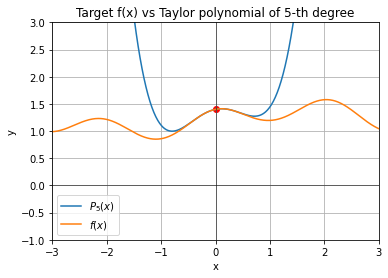

In [48]:
n=5
taylor_approx = taylor_poly(target_f, 0, n)

plot_function(taylor_approx, label=f"$P_{n}(x)$")
plot_function(target_f, x_lim=(-3, 3), y_lim=(-1, 3), label="$f(x)$")
plot_config(title=f"Target f(x) vs Taylor polynomial of {n}-th degree")
plt.scatter(0, target_f(0), color='red', label="a - point of interest")
plt.show()

What we want to look at now is how good is this polynomial actually approximating $f(x)$ as we move away from $x=a$ ($x=0$ or in this case). We want to define a remainder (error) function.
$$ R_{n, a}(x) $$
And we will define this function to be the difference between $f(x)$ and our approximation of $f(x)$ for any given x.
$$ R_{n, a}(x) = f(x) - P_{n, a}(x) $$
So for example if we wanted to see what is the error of this polynomial $P_{n, a}$ for $x=b$. $R_{n, a}(b) = ?$

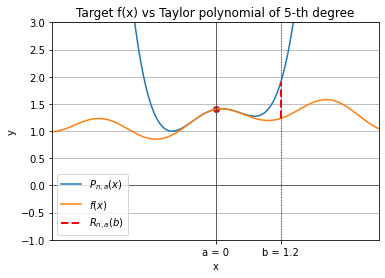

In [49]:
b = 1.2  # The specific point where we want to plot the difference

f_b = target_f(b)
p_b = taylor_approx(b)

plot_function(taylor_approx, label="$P_{n, a}(x)$")
plot_function(target_f, x_lim=(-3, 3), y_lim=(-1, 3), label="$f(x)$")
plt.plot([b, b], [f_b, p_b], color='red', linestyle='--', linewidth=2, label='$R_{n, a}(b)$')
plot_config(title=f"Target f(x) vs Taylor polynomial of {n}-th degree")
plt.scatter(0, target_f(0), color='red', label="a - point of interest")
plt.axvline(x=b, color='green', linestyle=':', linewidth=1, label='b')
plt.xticks([0, b], ['a = 0', f'b = {b}'])  # Set the tick location and label for 'b'
plt.show()

Well from the graph we can see that if $b=1.2$, the remainder will be the red distance. If we measure the error at $x=a$, it should be $0$, because $f(a) = P_{n, a}(a)$ since we defined the Taylor series this way. Also because at this point of interest $a$ all the derivatives of the target function $f$ are also equal to those of the Taylor polynomial $P_{n, a}$. Because of that we can say that each derivative (up to the n-th one) of the remainder function is also equal to 0 at $x=a$. 
$$ R_{n, a}(a) = f(a) - P(a) = 0 $$
$$ R_{n, a}'(a) = f'(a) - P'(a) = 0 $$
$$ R_{n, a}''(a) = f''(a) - P''(a) = 0 $$
$$ \vdots $$
$$ R_{n, a}^{(n)}(a) = f^{(n)}(a) - P^{(n)}(a) = 0 $$
So now let's see what happens if we take the $(n+1)$-th derivative of the error function.
$$ R_{n, a}^{(n+1)}(x) = f^{(n+1)}(x) - P_{n, a}^{(n+1)}(x) $$
We know that the $(n+1)$-th derivative of a polynomial of degree $n$ is equal to 0.
$$ R_{n, a}^{(n+1)}(x) = f^{(n+1)}(x) $$
We now want to bound the magnitude of this derivative (bound its absolute value), so that we can than bound the actual remainder function over the interval $[a;b]$, so that we can bound with certainty the remainder at the specific point $x=b$ (hopefully $ \left|R_{n, a}(b)\right| \leq K $ for $b > a$).

Suppose that:
$$ \left|f^{(n+1)}(x)\right| \leq M \\
\text{over } x \in [a; b] $$

If $f^{(n+1)}(x)$ is continuous than $M$ will be its maximum value over this interval. And because we already saw that this equals derivative equals to the same order derivative of the error function.

$$ \Rightarrow \left|R_{n, a}^{(n+1)}(x)\right| \leq M $$

If we integrate both sides we get: $\int\left|R_{n, a}^{(n+1)}(x)\right|\,dx \leq \int M\,dx$
It can be [proven](https://proofwiki.org/wiki/Absolute_Value_of_Definite_Integral) that $\left|\int f(x)\,dx\right| \leq \int\left|f(x)\right|\,dx$, so we get the following inequality:

$$\left|\int R_{n, a}^{(n+1)}(x)\,dx\right| \leq \int\left|R_{n, a}^{(n+1)}(x)\right|\,dx \leq \int M\,dx $$

Now the first integral here is pretty straight forward to evaluate. The antiderivative of the $(n+1)$-th derivative is just the $n$-th derivative.

$$\left|R_{n, a}^{(n)}(x)\right| \leq Mx + C $$

And since we are just taking indefinite integrals, we can't forget to add the constant. And in general when we try to create an upper bound, we want to make it as low as possible. So we want to minimize what this constant $C$ is. Also we actually do know that the $n$-th derivative of the remainder function is equal to 0, as we already established. So if we evaluate both sides at a, we get:

$$ \left|R_{n, a}^{(n)}(a)\right| = 0 \leq Ma + C $$
$$ -Ma \leq C $$

So if we want to minimize this constant $C$, from the above inequality we see that it has to be equal to $-Ma$. That is the lowest possible $C$, that will meet these constraints that we know are true. We can now rewrite this whole thing as follows:

$$ \left|R_{n, a}^{(n)}(x)\right| \leq M(x-a) $$

We can again integrate on both sides:

$$ \int\left|R_{n, a}^{(n)}(x)\right|\,dx \leq \int M(x-a)\,dx $$

$$ \text{we already saw that } \left|\int R_{n, a}^{(n)}(x)\,dx\right| \leq \int\left|R_{n, a}^{(n)}(x)\right|\,dx \leq \int M(x-a)\,dx $$

$$ \Rightarrow \left|R_{n, a}^{(n-1)}(x)\right| \leq \frac{M(x-a)^2}{2} + C $$

We can apply the same logic as we did a bit earlier ($R_{n, a}'(x) = R_{n, a}''(x) = \cdots = R_{n, a}^{(n)}(x) = 0$) and evaluate both sides at $x=a$: $ 0 \leq C $ Once again we want to minimize our upper bound (our constant) and take the lowest possible $C$, which meets these constraints. And in this case it is $C=0$. And if we keep going through the same process:
1. Integrating on both sides
2. Evaluating both sides at $x=a$ - left side will always be 0, and the whole equation will have the following general form:
$$ \Rightarrow \left|R_{n, a}^{(n-k)}(x)\right| \leq \frac{M(x-a)^{k+1}}{(k+1)!} + C $$
$$ \Downarrow $$
$$ 0 \leq C \text{ when evaluated at a} $$
3. Set $C$ equal to the lowest possible value (which will always be 0).

And we do this until we get to the actual function (the 0-th order derivative).
$$\left|R_{n, a}(x)\right| \leq \frac{M(x-a)^{n+1}}{(n+1)!} $$


And if we figure out how to evaluate this maximum value of our function over the interval $x\in[a;b]$, we now have a way of bounding the error function of our Taylor approximation polynomial over the given interval. This is called <b>Taylor's inequality</b>.

We can also see here clearly that the remainder will get smaller as we increase $n$, because the denominator will get a lot larger. 

Now that we have derived the Taylor inequality, what can we actually do with it?

### Is $e^x$ equal to it's Taylor series?

We mentioned a number of times and also used the fact that the function $e^x$ is analytic over its entire domain, so it is actually equal to its Taylor series. But now we can try and prove that, by looking at its remainder.

We know that:
$$ f(x) = e^x \Rightarrow f^{(n+1)}(x) = e^x $$

And let's say that the interval, which we are going to look at is from the point of interest $a$ (which in this case we will set equal to 0) and another point $b$. $\Rightarrow x \in [a;b]$
$$ x \leq b \Rightarrow e^x \leq e^b $$
Knowing that, we have successfully found the maximum value $M$ for the exponential function in the interval $[a;b]$. So the Taylor inequality will look like this:
$$\left|R_{n}(x)\right| \leq \frac{e^bx^{n+1}}{(n+1)!} $$

Now what will happen to the remainder as $N$ gets larger and larger - we add more and more terms to the approximation? Well $e^d$ is just some number, it won't make a difference as $n$ goes to $\infty$. In the numerator we have a polynomial - which is big, but still just a polynomial. In the denominator we have a <em>factorial</em>. And one of the things we know from the hierarchy of functions - the factorial will dominate the polynomial (factorial growth rate vs. polynomial growth rate). The proof for this is:

Let's define the sequence $\{a_n\}$, where: $ a_n = \frac{x^n}{n!} $ (<em>Note that $x$ here is just a number</em>)
$$ a_{n+1} = \frac{x^{n+1}}{(n+1)!} = \frac{x.x^n}{(n+1)n!}  $$
$$ \Rightarrow a_{n+1} = \frac{x}{(n+1)}a_n $$
$$ \Rightarrow a_n \text{ is eventually decreasing, because x is just a number here and } \lim_{n\to\infty} \frac{x}{(n+1)} = 0 $$
$$ \text{And also } a_n \text{ is bounded below }(a_n > 0) $$
$$ \Rightarrow a_n \text{ has a limit L by the Monotone convergence theorem } \Rightarrow \lim_{n\to\infty} a_{n}=L $$
$$  a_{n+1} = \frac{x}{(n+1)}a_n \Rightarrow \lim_{n\to\infty} a_{n+1} = \lim_{n\to\infty}\frac{x}{(n+1)}a_n $$
$$ \lim_{n\to\infty} a_{n+1} = \left(\lim_{n\to\infty}\frac{x}{(n+1)}\right)\left(\lim_{n\to\infty}a_n\right) $$
$$ L = 0 \cdot L $$
$$ L = 0 $$
$$ \Rightarrow \lim_{n\to\infty}\frac{x^{n+1}}{(n+1)!}=0 $$

So now that we have proven that, we can safely say that, as $n$ gets large, this entire remainder is going to 0 as $n$ goes to $\infty$:

$$\left|R_{n}(x)\right| \leq \frac{e^bx^{n+1}}{(n+1)!} \to 0 \text{ as } n \to \infty$$

That means that our remainder is actually really really good. That's what we wanted - our best case scenario. It says that if we take enough terms, our remainder could be as small as we wish / need for our use case. And more than that we now know for certain that for $f(x) = e^x$:
$$ R_{n, a}(x) = f(x) - P_{n, a}(x) $$
$$ \Rightarrow f(x) = P_{n, a}(x) + R_{n, a}(x) $$
$$ \text{and as } n \to \infty, R_{n, a}(x) \to 0 \Rightarrow \text{as } n\to\infty, f(x) = P_{n, a}(x) + 0 \Rightarrow f(x) = P_{n, a}(x) $$
$$ e^x = P_{n, a}(x) $$
$$ e^x =  1 + \frac{x}{1!} + \frac{x^2}{2!} + \frac{x^3}{3!} + \frac{x^4}{4!} + \cdots = \sum_{n=0}^{\infty} \frac{x^n}{n!} $$

That is why the Taylor inequality is so important and it is what makes the Taylor series actually work. Now we can apply the same logic to the other traditional entire analytic functions, like $\cos$ and $\sin$ and prove mathematically, not just intuitively that they are equal to their Taylor series.

### Truncation errors for Taylor series. Choosing the degree of the Taylor polynomial

We've already established that for some functions, when we increase the degree of the Taylor approximation polynomial, we will get a better and better approximation for bigger and bigger intervals around the point of interest. Let's make some experiments to show how much exactly does adding new terms increase the accuracy of the Taylor polynomial, because in practice we can't actually compute infinite sums - we don't have infinite resources/time.

For the sake of computational efficiency let's "hardcode" the Taylor series approximation with a varying degree polynomial of $e^x$ and $\cos(x)$ as it is given by their expansion, which we already derived.
$$ e^x = \sum_{n=0}^{\infty}\frac{1}{n!}x^n $$
$$ \cos(x) = \sum_{n=0}^{\infty}\frac{(-1)^n}{(2n)!}x^{2n} $$

In [50]:
def exp_taylor_poly(deg):
    def _exp_taylor_poly_inner(x):
        exp = 0
        for current_degree in range(deg + 1):
            exp = exp + ((x**current_degree) / np.math.factorial(current_degree))
        return exp
    return _exp_taylor_poly_inner

def cos_taylor_poly(deg):
    def _cos_taylor_poly_inner(x):
        exp = 0
        for current_degree in range(deg // 2 + 1):
            exp = exp + ((-1) ** current_degree) * (x ** (2 * current_degree)) / np.math.factorial(2 * current_degree)
        return exp
    return _cos_taylor_poly_inner

And now we can plot the first 7 derivatives for both $e^x$ and $\cos(x)$ (for $\cos$ we can skip the odd degrees because they are the same as the even ones).

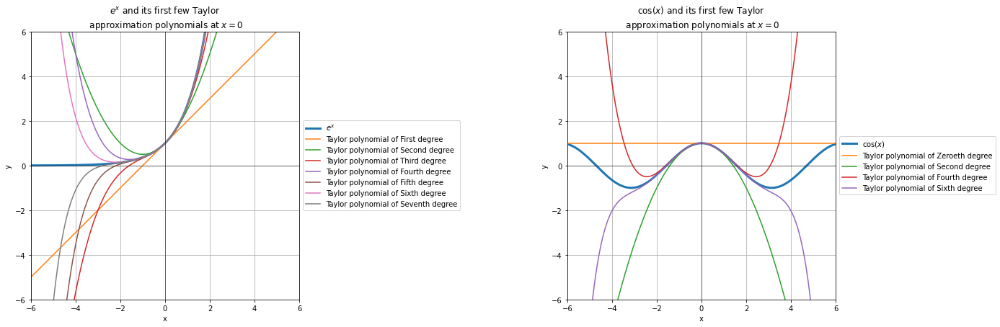

In [51]:
plt.figure(figsize=(20, 10))  # Adjust the figure size

# First subplot for exp(x)
plt.subplot(1, 2, 1)
plot_function(sp.exp, label="$e^x$", linewidth=3)

ordinal_numbers = ["Zeroeth", "First", "Second", "Third", "Fourth", "Fifth", "Sixth", "Seventh"]

# Plot Taylor approximation polynomials for exp(x)
for deg in range(1, 8):
    plot_function(exp_taylor_poly(deg), label=f"Taylor polynomial of {ordinal_numbers[deg]} degree")
    
plot_config(title="$e^x$ and its first few Taylor\n approximation polynomials at $x=0$", \
            bbox_to_anchor=(1, 0.5), legend_loc="center left")

# Second subplot for cos(x)
plt.subplot(1, 2, 2)
plot_function(sp.cos, label="$\cos(x)$", linewidth=3)

# Plot Taylor approximation polynomials for cos(x)
for deg in range(0, 8, 2):
    plot_function(cos_taylor_poly(deg), label=f"Taylor polynomial of {ordinal_numbers[deg]} degree")
    
plot_config(title="$\cos(x)$ and its first few Taylor\n approximation polynomials at $x=0$", \
            bbox_to_anchor=(1, 0.5), legend_loc="center left")

plt.subplots_adjust(wspace=1)
plt.show()

We notice that with even only seven degrees of freedom, the approximation approaches the analytic function very quickly, even for $x$ not near $a=0$.

Let's approximate now e^2 with different order of Taylor polynomials and print out the results:

In [52]:
x_test = 2
actual_value = np.exp(x_test)

for degree in range(11):
    current_taylor_poly = exp_taylor_poly(degree)
    current_relative_error_fn = relative_error(current_taylor_poly, np.exp)
    approx_value = current_taylor_poly(x_test)
    current_relative_error = current_relative_error_fn(x_test)
    print(f"Using {degree} terms the approximated value for e^2 is: {approx_value:.7f} and the relative error: {current_relative_error:.7f}%")
    
print(f"The true value for e^2 is: {np.exp(2)}")

Using 0 terms the approximated value for e^2 is: 1.0000000 and the relative error: 86.4664717%
Using 1 terms the approximated value for e^2 is: 3.0000000 and the relative error: 59.3994150%
Using 2 terms the approximated value for e^2 is: 5.0000000 and the relative error: 32.3323584%
Using 3 terms the approximated value for e^2 is: 6.3333333 and the relative error: 14.2876540%
Using 4 terms the approximated value for e^2 is: 7.0000000 and the relative error: 5.2653017%
Using 5 terms the approximated value for e^2 is: 7.2666667 and the relative error: 1.6563608%
Using 6 terms the approximated value for e^2 is: 7.3555556 and the relative error: 0.4533806%
Using 7 terms the approximated value for e^2 is: 7.3809524 and the relative error: 0.1096719%
Using 8 terms the approximated value for e^2 is: 7.3873016 and the relative error: 0.0237447%
Using 9 terms the approximated value for e^2 is: 7.3887125 and the relative error: 0.0046498%
Using 10 terms the approximated value for e^2 is: 7.3889

As we can see at the start, because $x=2$ was relatively far from our point of interest $0$, the approximation was far of, but as we added more and more terms we started to get a result, which we could actually comfortably work with (for 10 terms of the polynomial - less than $0.001\%$ error).

We can also plot this error for $x=2$, just so we can see how quickly it goes down.

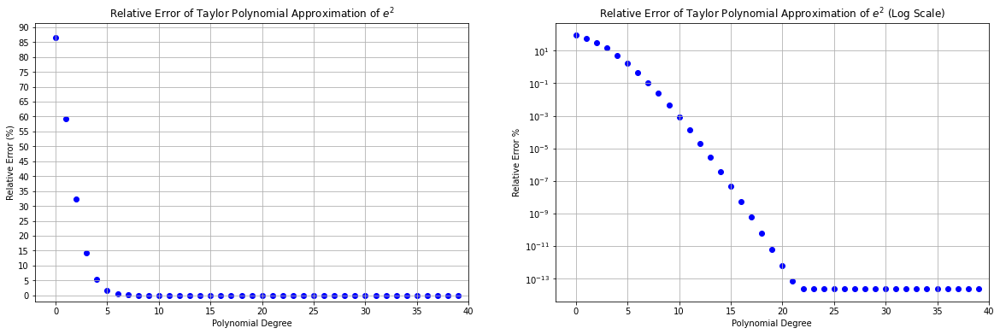

In [53]:
poly_degrees = np.arange(0, 40)
relative_errors = np.array([])
for deg in poly_degrees:
    current_taylor_poly = exp_taylor_poly(deg)
    current_relative_error_fn = relative_error(current_taylor_poly, np.exp)
    current_relative_error = current_relative_error_fn(x_test)
    relative_errors = np.append(relative_errors, current_relative_error)
    
plt.figure(figsize=(20, 6))
plt.subplot(1, 2, 1)
plt.scatter(poly_degrees, relative_errors, color='blue', marker='o')
plt.xlabel('Polynomial Degree')
plt.ylabel('Relative Error (%)')
plt.title('Relative Error of Taylor Polynomial Approximation of $e^2$')
plt.grid(True)
plt.xlim(-2, 40)
plt.ylim(-2, np.max(relative_errors) + 5)
plt.xticks(np.arange(0, 41, 5))
plt.yticks(np.arange(0, np.max(relative_errors) + 5, 5))

plt.subplot(1, 2, 2)
plt.scatter(poly_degrees, relative_errors, color='blue', marker='o')
plt.xlabel('Polynomial Degree')
plt.ylabel('Relative Error %')
plt.title('Relative Error of Taylor Polynomial Approximation of $e^2$ (Log Scale)')
plt.grid(True)
plt.xlim(-2, 40)
plt.yscale('log')
plt.xticks(np.arange(0, 41, 5))
plt.show()

As we can see, the error goes down really fast and is very close to 0 only after the 10-th degree. We can always choose the accuracy that we want with the cost of computational complexity. But for each order we choose, the approximation can only be useful to us if we have an idea of how accurate it is. We already saw that this expected maximum error of any approximation of the $n$-th degree is given by the <b>Taylor Remainder Estimation Function</b>. The bound for the error of the Taylor polynomial at a given degree $n$ is given to us by the inequality:

$$\left|E_{n, a}(x)\right| \leq \frac{M(x-a)^{n+1}}{(n+1)!} $$


Using this we can for example definitively bound the error of the 9-th degree Taylor polynomial, predicting $e^x$, centered around $x=0$, when evaluating it for $x=2$. Since $e^x < 3^x\ (e < 3)$, we can say that:
$$ \left|E_{9, 0}(2)\right| \leq \frac{3^22^{9+1}}{(9+1)!} = 0.00254 $$

Therefore, if we use Taylor series with n = 9 to approximate $e^2$, our absolute error should be less than 0.00254. Let's quickly test that:

In [54]:
np.abs(exp_taylor_poly(9)(2) - np.exp(2)) < 0.00254

True

## Overview

Let's review what we did here on a more philosophical level.
We are basically taking information about higher order derivatives of a function at a single point and then translating it into information about the value of the function near that point.
$$ \LARGE\substack{
    \text{Derivative} \\
    \text{information} \\
    \text{at a point}
} \LARGE\longrightarrow \LARGE\substack{
    \text{Output} \\
    \text{information} \\
    \text{near that point}
} $$

In mathematical discourse, the Taylor series embodies the fundamental principles of approximation, convergence, and the interdependence of local and global properties. It demonstrates the power of mathematical abstraction to capture the essence of complex functions and reveals the intrinsic harmony between the microscopic and macroscopic aspects of a function's behaviour. It symbolizes the power of mathematical abstraction to distill intricate phenomena into comprehensible forms, providing us with a pathway to explore and navigate the depths of mathematical and scientific landscapes. It allowed us to have a better understanding of otherwise seemingly unconnected constants and mathematical functions like the exponent, trigonometric functions and the imaginary unit. On a practical level, the Taylor series finds extensive application across various scientific and engineering disciplines. Its ability to approximate complex functions with simpler polynomial expressions makes it a valuable tool in both theoretical analysis and practical computations.

# Resources

1. https://en.wikipedia.org/wiki/Function_approximation
2. https://en.wikipedia.org/wiki/Interpolation
3. https://econ.lse.ac.uk/staff/wdenhaan/numerical/functionapproximation.pdf
4. https://sites.oxy.edu/ron/math/120/03/labs/lab8.PDF
5. https://en.wikipedia.org/wiki/Stone%E2%80%93Weierstrass_theorem
6. https://www.expii.com/t/what-is-a-polynomial-approximation-317
7. https://www.youtube.com/watch?v=BLkz5LGWihw
8. https://www.youtube.com/watch?v=sy132cgqaiU
9. https://www.youtube.com/watch?v=3d6DsjIBzJ4
10. https://www.youtube.com/watch?v=-gRNRBCG3Ow 
11. https://www.youtube.com/watch?v=bC5Lahh4Aus
12. https://www.youtube.com/watch?v=Iub16Y1ZXRw
13. https://www.youtube.com/watch?v=wgkRH5Uoavk
14. https://www.youtube.com/watch?v=yUUPP70Fhpo
15. https://math.stackexchange.com/questions/892104/how-to-calculate-limit-of-a-function-having-factorial-in-denominator
16. https://pythonnumericalmethods.berkeley.edu/notebooks/chapter18.03-Discussion-on-Errors.html
17. https://chat.openai.com - only as a creative assistant, when writing and not as an actual source of information.